In [1]:
pip freeze> requirements.txt

Note: you may need to restart the kernel to use updated packages.


## Initial Query Setup 

In [1]:
import requests
import pandas as pd
import warnings
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

In [2]:
# census_api_params = {
#     'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
#     'host': 'https://api.census.gov/data',
#     'year': '/2022',
#     'dataset_acronym': '/acs/acs1',
#     'g': '?get=',
#     'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
#     'location_states': '&for=state:*'
# }
census_api_params = {
    'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
    'host': 'https://api.census.gov/data',
    'year': '/2022',
    'dataset_acronym': '/acs/acs1',
    'g': '?get=',
    'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
    'location_states': '&for=congressional%20district:*'
}


In [3]:
variable_to_desc_map = {
    'NAME': 'Name',
    'B01001_001E': 'Total Population by Age and Sex',
    'B01001_026E': 'Total Female Population by Age',
    'B29001_001E': 'Total Voting-Age Citizens',
    'B29001_002E': 'Voting-Age Citizens, 18-29',
    'B29001_003E': 'Voting-Age Citizens, 30-44',
    'B29001_004E': 'Voting-Age Citizens, 45-64',
    'B29001_005E': 'Voting-Age Citizens, 65+',
    'B29002_002E': 'Less than 9th Grade',
    'B29002_003E': '9th-12th Grade, No Diploma',
    'B29002_004E': 'High School Graduate',
    'B29002_005E': 'Some College, No Degree',
    'B29002_006E': 'Associate’s Degree',
    'B29002_007E': 'Bachelor’s Degree',
    'B29002_008E': 'Graduate/Professional Degree',
    'B29003_002E': 'Income Below Poverty',
    'B29003_003E': 'Income Above Poverty',
    'B29004_001E': 'Median Household Income',
    'B05003_001E': 'Total by Sex, Age, Citizenship',
    'B05003_008E': 'Male Citizens, 18+',
    'B05003_009E': 'Male Citizens, 18+ Native',
    'B05003_011E': 'Male Citizens, 18+ Foreign-Born Citizen',
    'B05003_019E': 'Female Citizens, 18+',
    'B05003_020E': 'Female Citizens, 18+ Native',
    'B05003_022E': 'Female Citizens, 18+ Foreign-Born Citizen',
    'B27001_001E': 'Total Health Insurance Coverage',
    'B27001_004E': 'Insured Males, Under 6',
    'B27001_005E': 'Uninsured Males, Under 6',
    'B27001_006E': 'Males, 6-18',
    'B27001_007E': 'Insured Males, 6-18',
    'B27001_008E': 'Uninsured Males, 6-18',
    'B27002_001E': 'Total Private Health Insurance Coverage',
    'B27002_004E': 'Private Insured Males, Under 6',
    'B27002_005E': 'Private Uninsured Males, Under 6',
    'B27002_006E': 'Private Males, 6-18',
    'B27002_007E': 'Private Insured Males, 6-18',
    'B27002_008E': 'Private Uninsured Males, 6-18',
    'B05012_002E': 'Native Population',
    'B05012_003E': 'Foreign-Born Population',
    'B05003B_001E': 'Black Population by Sex, Age, Citizenship',
    'B05003C_001E': 'Native American Population by Sex, Age, Citizenship',
    'B05003D_001E': 'Asian Population by Sex, Age, Citizenship',
    'B16008_001E': 'Citizenship by Language & English Ability',
    'B16008_002E': 'Native Population by Language',
    'B16008_003E': 'Native Population, 5-17 Years',
    'B16008_004E': 'Native 5-17, English Only',
    'B19001_001E': 'Household Income (Adjusted)',
    'B19013_001E': 'Median Household Income (Adjusted)',
    'B19301_001E': 'Per Capita Income (Adjusted)',
    'B17001_001E': 'Poverty by Sex, Age',
    'B17001_002E': 'Below Poverty',
    'B17001_003E': 'Below Poverty, Male',
    'B02001_002E': 'White Alone',
    'B03002_003E': 'Non-Hispanic White',
    'B03002_004E': 'Non-Hispanic Black',
    'C17002_001E': 'Income to Poverty Ratio',
    'C17002_002E': 'Below 0.50 Poverty Line',
    'B01002_001E': 'Median Age',
    'B15003_001E': 'Educational Attainment, 25+',
    'C24050_001E': 'Employment by Industry',
    'C24050_002E': 'Employment in Agriculture',
    'C24050_003E': 'Employment in Construction',
    'C24050_004E': 'Employment in Manufacturing',
    'C24050_005E': 'Employment in Wholesale',
    'C24050_006E': 'Employment in Retail',
    'C24050_007E': 'Employment in Transport & Utilities',
    'C24050_008E': 'Employment in Information',
    'C24050_009E': 'Employment in Finance & Real Estate',
    'C24050_010E': 'Employment in Professional Services',
    'C24050_011E': 'Employment in Education & Health',
    'C24050_012E': 'Employment in Arts & Food',
    'C24050_013E': 'Employment in Other Services',
    'C24050_014E': 'Employment in Public Administration',
    'B25002_003E': 'Vacant Housing Units',
    'B25010_003E': 'Renter-Occupied Housing Units',
    'B25071_001E': 'Median Rent as % of Income',
}

print(len(variable_to_desc_map))

76


In [4]:
def fetch_voting_demographics_data(query_variables, census_api_params=census_api_params):
    US_CENSUS_API_KEY = census_api_params['US_CENSUS_API_KEY']
    host = census_api_params['host']
    year = census_api_params['year']
    dataset_acronym = census_api_params['dataset_acronym']
    g = census_api_params['g']
    location_states = census_api_params['location_states']
    usr_key = census_api_params['usr_key']
    
    # Define the variables for the query
    variables_voting_demographics = query_variables

    # Construct the query URL
    query_url_voting_demographics = f"{host}{year}{dataset_acronym}{g}{variables_voting_demographics}{location_states}{usr_key}"

    # Use requests package to call out to the API
    response_voting_demographics = requests.get(query_url_voting_demographics)

    # Convert the response to JSON
    data_voting_demographics = response_voting_demographics.json()

    # Create a dataframe from the JSON data
    columns_voting_demographics = data_voting_demographics[0]
    data_voting_demographics = data_voting_demographics[1:]
    df_voting_demographics = pd.DataFrame(data_voting_demographics, columns=columns_voting_demographics)


    # BEGIN: drop the last column
    df_voting_demographics = df_voting_demographics.iloc[:, :-1]
    # END: drop the last column

    return df_voting_demographics

# Example usage:
# Define the variables for the query
query_variables = 'NAME,B01001_001E,B01001_026E,B01002_001E,B15003_001E,C24050_001E,B19013_001E,B02001_001E,B17001_002E,C24050_002E,C24050_003E,C24050_004E,C24050_005E,C24050_006E,C24050_007E,C24050_008E,C24050_009E,C24050_010E,C24050_011E,C24050_012E,C24050_013E,C24050_014E'
df_district = fetch_voting_demographics_data(query_variables, census_api_params)

In [5]:
query_variables = ','.join(variable_to_desc_map.keys())

def process_voting_demographics_data(variable_to_desc_map, census_api_params):
    # Split the variables into chunks of 50
    variable_chunks = [list(variable_to_desc_map.keys())[i:i + 50] for i in range(0, len(variable_to_desc_map), 50)]

    # Initialize an empty dataframe
    df_district = pd.DataFrame()

    # Fetch data for each chunk and concatenate the results
    for chunk in variable_chunks:
        query_variables = ','.join(chunk)
        df_chunk = fetch_voting_demographics_data(query_variables, census_api_params)
        if df_district.empty:
            df_district = df_chunk
        else:
            df_district = pd.concat([df_district, df_chunk.iloc[:, 1:]], axis=1)

    df_district.rename(columns=variable_to_desc_map, inplace=True)
    return df_district

# Example usage:
df_district = process_voting_demographics_data(variable_to_desc_map, census_api_params)
# Display the combined dataframe
df_district.head()

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Employment in Finance & Real Estate,Employment in Professional Services,Employment in Education & Health,Employment in Arts & Food,Employment in Other Services,Employment in Public Administration,Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,state
0,"Congressional District 1 (118th Congress), Ala...",730935,376261,560099,102653,132021,185192,140233,11997,43369,...,19104,32007,70525,29506,16194,13445,64946,2.18,33.3,01
1,"Congressional District 2 (118th Congress), Ala...",723094,372589,545657,102347,138444,175149,129717,16414,46568,...,18259,28709,67009,26261,10704,28760,48925,2.36,27.7,01
2,"Congressional District 3 (118th Congress), Ala...",723164,371970,560621,122144,128196,179120,131161,16139,50777,...,17621,26971,74189,27462,16298,16589,47202,2.27,29.0,01
3,"Congressional District 4 (118th Congress), Ala...",727607,372781,547069,100430,129490,180781,136368,21196,56294,...,13143,26043,69059,26232,16775,13661,47055,2.27,27.4,01
4,"Congressional District 5 (118th Congress), Ala...",743238,376062,565941,110702,135764,192541,126934,14593,37205,...,16177,58618,63946,25549,17117,27230,27560,2.18,26.2,01


In [6]:
print(f"Number of rows in df_district: {df_district.shape[0]}")
print(f"Number of columns in df_district: {df_district.shape[1]}")

Number of rows in df_district: 437
Number of columns in df_district: 77


In [7]:
ny15_data = df_district[df_district['Name'].str.contains('New York', na=False)]
display(ny15_data.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Employment in Finance & Real Estate,Employment in Professional Services,Employment in Education & Health,Employment in Arts & Food,Employment in Other Services,Employment in Public Administration,Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,state
258,"Congressional District 1 (118th Congress), New...",775158,394587,583063,104297,116919,207724,154123,13182,18484,...,31814,52929,112971,32246,17269,19987,50879,2.40,35.9,36
259,"Congressional District 2 (118th Congress), New...",775081,385310,555178,113990,126946,195468,118774,18583,24007,...,25676,50492,107218,31762,17442,21673,18437,2.64,36.5,36
260,"Congressional District 3 (118th Congress), New...",771208,395271,565585,95470,114208,198634,157273,17801,20544,...,44726,56309,117038,24360,16215,15872,13310,2.31,30.9,36
261,"Congressional District 4 (118th Congress), New...",771912,391025,552505,104654,130488,182654,134709,21015,20452,...,31669,47924,128602,28621,14122,19726,12513,2.70,32.9,36
262,"Congressional District 5 (118th Congress), New...",751997,390297,509037,103606,111106,176374,117951,31162,37758,...,23533,35175,110692,23297,16539,22826,15512,2.58,32.5,36


## Block / County data

In [8]:
census_api_params = {
    'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
    'host': 'https://api.census.gov/data',
    'year': '/2022',
    'dataset_acronym': '/acs/acs5',  # Note: acs5 includes block group data, whereas acs1 does not.
    'g': '?get=',
    'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
    'location_states': '&for=block%20group:*&in=state:36%20county:*'
}
# &for=block%20group:*&in=state:06%20county:073
# https://api.census.gov/data/2022/acs/acs5?get=NAME,B01001_001E&for=block%20group:*&in=state:06%20county:073&key=YOUR_KEY_GOES_HERE
# process_voting_demographics_data(variable_to_desc_map, census_api_params)
# query_variables = 'NAME,B01001_001E'

df_block = process_voting_demographics_data(variable_to_desc_map, census_api_params)

### Dealing with missing data

In [9]:
# Remove columns with all NaN values
df_block = df_block.dropna(axis=1, how='all')
# Remove duplicate columns
df_block = df_block.loc[:, ~df_block.columns.duplicated()]
# Display the cleaned DataFrame
ny_blocks = df_block[df_block['Name'].str.contains('New York', na=False)]
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,White Alone,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income
0,Block Group 1; Census Tract 1; Albany County; ...,724,435,634,182,97,146,209,53,93,...,351,334,205,724,41,45.2,494,75,1.95,20.9
1,Block Group 2; Census Tract 1; Albany County; ...,1535,815,935,267,254,257,157,106,88,...,399,391,777,1527,197,22.4,693,68,3.53,41.9
2,Block Group 1; Census Tract 2.01; Albany Count...,245,204,169,23,55,32,59,0,32,...,37,37,174,245,12,38.8,169,141,1.80,40.3
3,Block Group 2; Census Tract 2.01; Albany Count...,1437,618,1181,183,238,609,151,32,264,...,140,124,1090,1437,252,47.1,1076,293,1.85,51.0
4,Block Group 3; Census Tract 2.01; Albany Count...,783,324,598,41,346,113,98,0,46,...,211,211,478,783,94,37.1,642,110,1.75,28.2


In [10]:
ny_blocks.head().to_excel('ny_blocks.xlsx', index=False)

### Visualization & Cleaning 

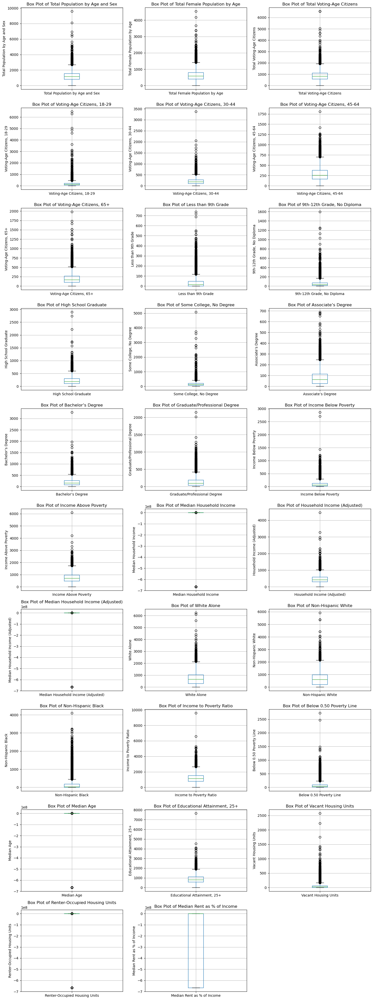

In [11]:
# List of variables to plot
variables_to_plot = [
    'Total Population by Age and Sex', 'Total Female Population by Age', 'Total Voting-Age Citizens',
    'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64',
    'Voting-Age Citizens, 65+', 'Less than 9th Grade',
    '9th-12th Grade, No Diploma', 'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
    'Bachelor’s Degree', 'Graduate/Professional Degree',
    'Income Below Poverty', 'Income Above Poverty', 'Median Household Income', 'Household Income (Adjusted)',
    'Median Household Income (Adjusted)', 'White Alone', 'Non-Hispanic White',
    'Non-Hispanic Black', 'Income to Poverty Ratio', 'Below 0.50 Poverty Line', 'Median Age',
    'Educational Attainment, 25+', 'Vacant Housing Units',	'Renter-Occupied Housing Units',	'Median Rent as % of Income'
]

# Convert columns to numeric, errors='coerce' will replace non-numeric values with NaN
ny_blocks[variables_to_plot] = ny_blocks[variables_to_plot].apply(pd.to_numeric, errors='coerce')

def plot_box_plots(df, variables_to_plot):
    # Convert columns to numeric, errors='coerce' will replace non-numeric values with NaN
    df[variables_to_plot] = df[variables_to_plot].apply(pd.to_numeric, errors='coerce')
    # Calculate the number of required rows for the subplot grid
    num_rows = (len(variables_to_plot) + 2) // 3
    # Plot box plots for each variable in a subplot grid
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 40))
    axes = axes.flatten()

    for i, variable in enumerate(variables_to_plot):
        df.boxplot(column=variable, ax=axes[i])
        axes[i].set_title(f'Box Plot of {variable}')
        axes[i].set_ylabel(variable)
        axes[i].grid(True)

    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Test the function
plot_box_plots(ny_blocks, variables_to_plot)

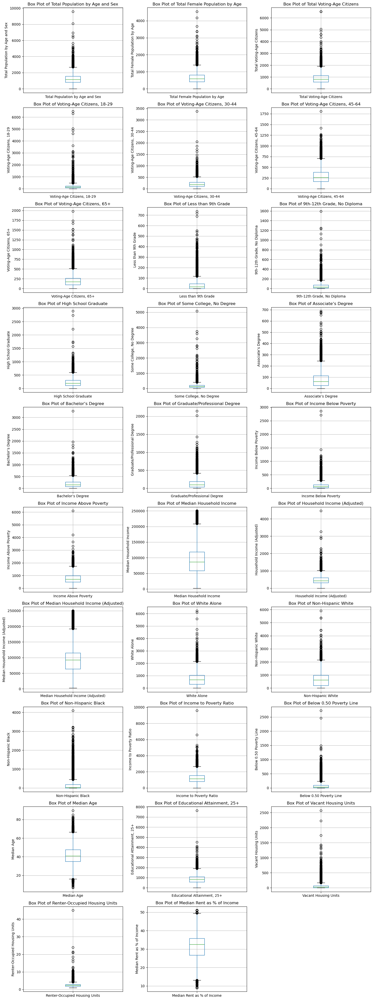

In [12]:
# Function to replace negative values with the mean of the column
def replace_negatives_with_mean(df):
    for col in df.columns:
        if df[col].dtype in ['int64', 'float64']:
            mean_value = df[df[col] >= 0][col].mean()
            df[col] = df[col].apply(lambda x: mean_value if x < 0 else x)
    return df

# Apply the function to the DataFrame
ny_blocks = replace_negatives_with_mean(ny_blocks)

# Replot the box plots for each variable in a subplot grid
plot_box_plots(ny_blocks, variables_to_plot)

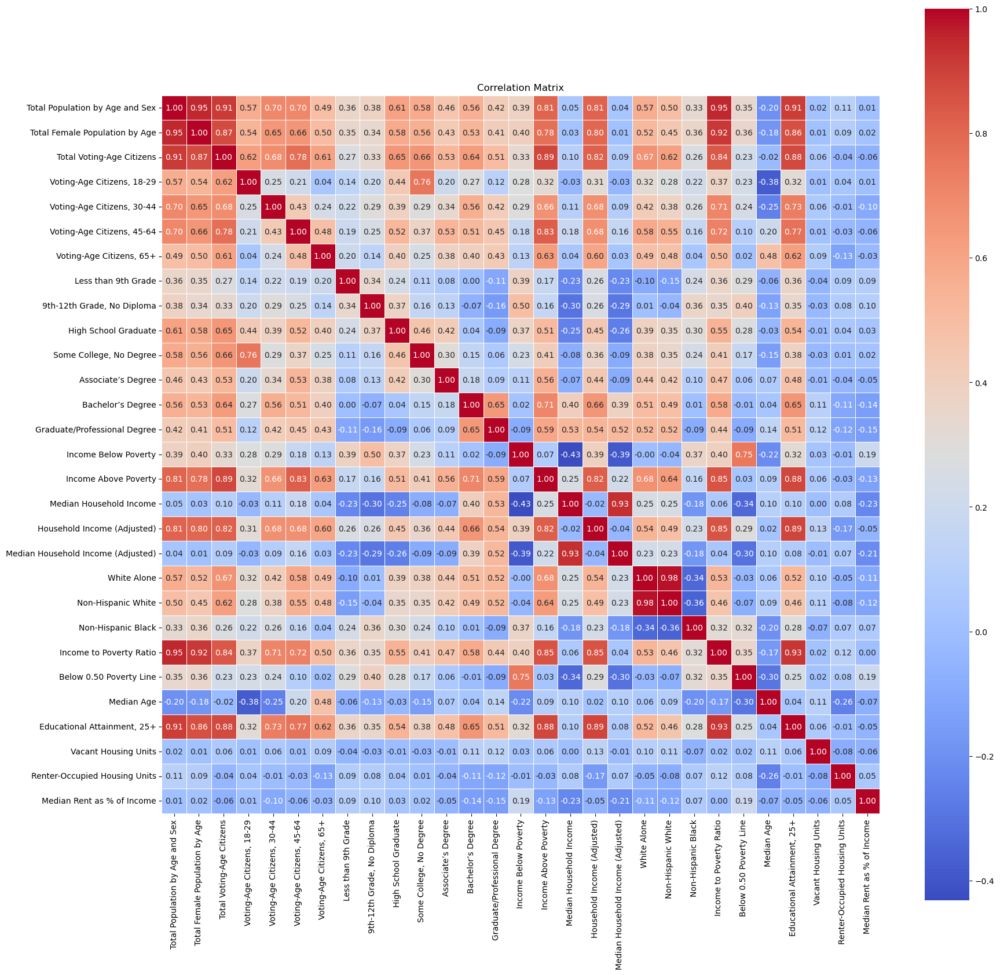

In [85]:
import seaborn as sns

import matplotlib.pyplot as plt

def plot_correlation_matrix(df, variables_to_plot, title='Correlation Matrix'):
    # Calculate the correlation matrix for the specified variables
    corr = df[variables_to_plot].corr()

    # Set up the matplotlib figure
    plt.figure(figsize=(20, 20))

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)

    # Set the title
    plt.title(title)

    # Show the plot
    plt.show()

# Example usage:
plot_correlation_matrix(ny_blocks, variables_to_plot)

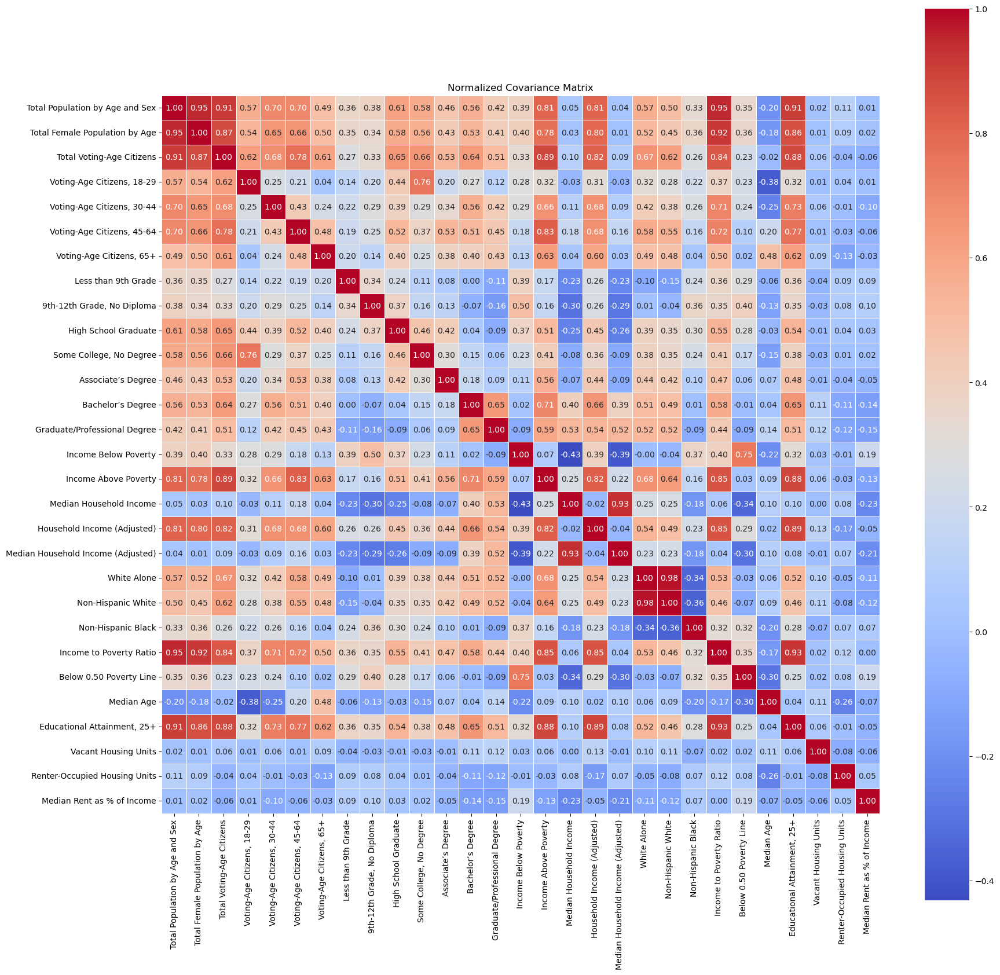

In [86]:
import seaborn as sns

import matplotlib.pyplot as plt

def plot_covariance_matrix(df, variables_to_plot, title='Normalized Covariance Matrix'):
    # Calculate the covariance matrix for the specified variables
    cov = df[variables_to_plot].cov()

    # Normalize the covariance matrix
    std_dev = np.sqrt(np.diag(cov))
    cov_normalized = cov / np.outer(std_dev, std_dev)

    # Set up the matplotlib figure
    plt.figure(figsize=(20, 20))

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cov_normalized, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)

    # Set the title
    plt.title(title)

    # Show the plot
    plt.show()

# Example usage:
plot_covariance_matrix(ny_blocks, variables_to_plot)

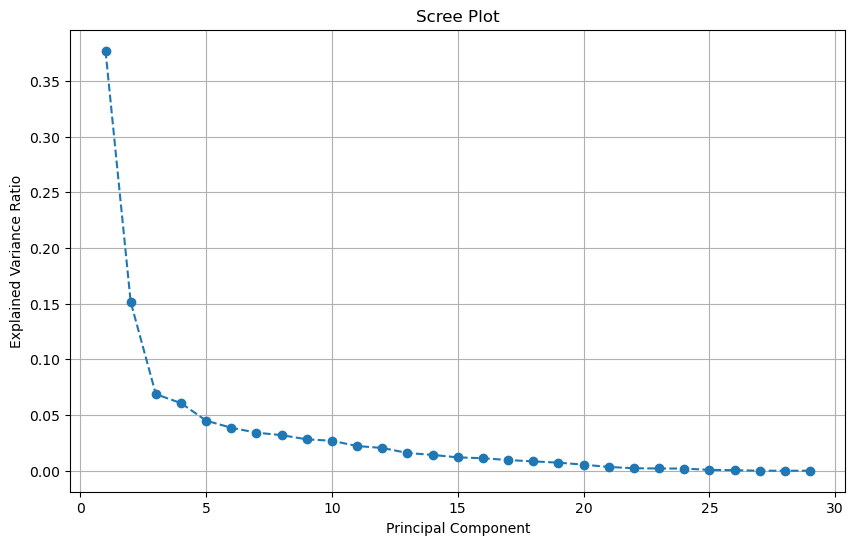

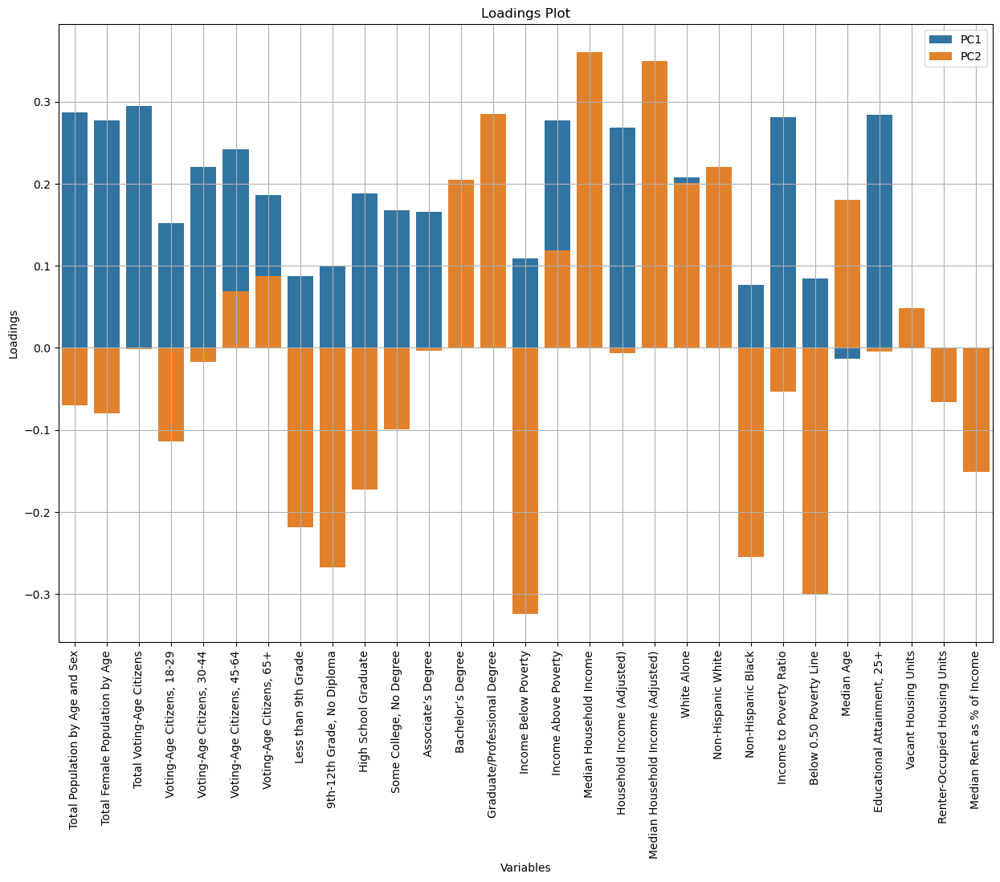

In [15]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Select the variables for PCA
variables_for_pca = variables_to_plot
# Standardize the data
scaler = StandardScaler()
ny_blocks_scaled = scaler.fit_transform(ny_blocks[variables_for_pca])

# Perform PCA
pca = PCA(n_components=len(variables_for_pca))
ny_blocks_pca = pca.fit_transform(ny_blocks_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Create a DataFrame for the PCA components
pca_columns = [f'PC{i+1}' for i in range(pca.n_components_)]
ny_blocks_pca_df = pd.DataFrame(ny_blocks_pca, columns=pca_columns)
ny_blocks_pca_df['Name'] = ny_blocks['Name']

# Create a DataFrame for loadings
loadings_df = pd.DataFrame(pca.components_.T, columns=pca_columns, index=variables_for_pca).reset_index()
loadings_df.rename(columns={'index': 'Variable'}, inplace=True)

# Scree plot to show the explained variance by each principal component
def plot_scree(explained_variance_ratio):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
    plt.title('Scree Plot')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.grid(True)
    plt.show()

# Loading plot to show the contribution of each variable to the principal components
def plot_loadings(loadings_df, num_components=2):
    plt.figure(figsize=(15, 10))
    for i in range(num_components):
        component = f'PC{i+1}'
        sns.barplot(x='Variable', y=component, data=loadings_df, label=component)
    plt.title('Loadings Plot')
    plt.xlabel('Variables')
    plt.ylabel('Loadings')
    plt.xticks(rotation=90)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the scree plot
plot_scree(explained_variance_ratio)

# Plot the loadings plot
plot_loadings(loadings_df)


In [16]:
pca.explained_variance_ratio_[:15].sum()

np.float64(0.947316590561049)

Top 10 most influential variables based on loadings from the first three principal components:
['Total Population by Age and Sex', 'Income Above Poverty', 'Total Female Population by Age', 'Income to Poverty Ratio', 'White Alone', 'Bachelor’s Degree', 'Non-Hispanic White', 'Total Voting-Age Citizens', 'Graduate/Professional Degree', 'Voting-Age Citizens, 45-64', 'Educational Attainment, 25+', 'High School Graduate', 'Voting-Age Citizens, 65+', 'Household Income (Adjusted)', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 18-29', 'Income Below Poverty', 'Median Household Income', 'Median Household Income (Adjusted)', 'Below 0.50 Poverty Line', 'Some College, No Degree', '9th-12th Grade, No Diploma', 'Non-Hispanic Black', 'Associate’s Degree', 'Less than 9th Grade']


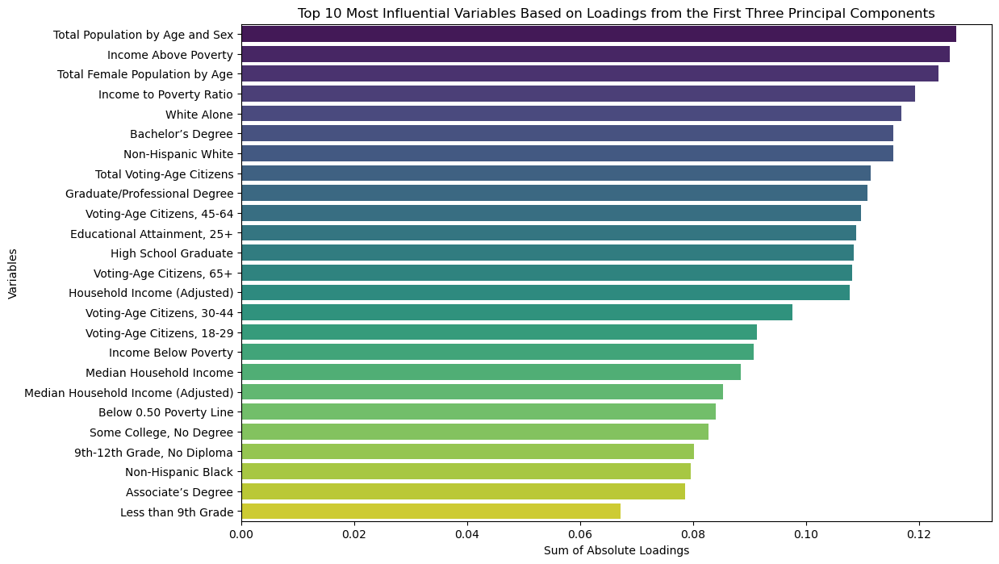

In [17]:
# Calculate the absolute values of the loadings for the first three principal components
abs_loadings = loadings_df.iloc[:, 1:4].abs()

# Scale the sum by explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_[:3]
scaled_abs_loadings = abs_loadings * explained_variance_ratio

# Sum the scaled absolute loadings for each variable
sum_abs_loadings = scaled_abs_loadings.sum(axis=1)

# Select the top 10 variables with the highest sum of absolute loadings
top_10_variables = sum_abs_loadings.nlargest(25).index

# Get the names of the top 10 variables
top_10_variable_names = loadings_df.loc[top_10_variables, 'Variable'].tolist()

print("Top 10 most influential variables based on loadings from the first three principal components:")
print(top_10_variable_names)

# Plot the top 10 most influential variables based on loadings
plt.figure(figsize=(12, 8))
sns.barplot(x=sum_abs_loadings[top_10_variables], y=top_10_variable_names, palette="viridis")
plt.title("Top 10 Most Influential Variables Based on Loadings from the First Three Principal Components")
plt.xlabel("Sum of Absolute Loadings")
plt.ylabel("Variables")
plt.show()

[0.37700694 0.15155488 0.06871202 0.06068554 0.04492902 0.03855805
 0.03415165 0.03194446 0.0281459  0.02690505 0.02216804 0.0204275
 0.01594894 0.01418323 0.01199536]
Top 10 most influential variables based on loadings and scree plot:
['Bachelor’s Degree', 'White Alone', 'Non-Hispanic White', 'High School Graduate', 'Voting-Age Citizens, 65+', 'Graduate/Professional Degree', 'Voting-Age Citizens, 18-29', 'Associate’s Degree', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64', '9th-12th Grade, No Diploma', 'Non-Hispanic Black', 'Income Above Poverty', 'Income to Poverty Ratio', 'Below 0.50 Poverty Line', 'Some College, No Degree', 'Household Income (Adjusted)', 'Income Below Poverty', 'Less than 9th Grade', 'Total Population by Age and Sex', 'Total Female Population by Age', 'Educational Attainment, 25+', 'Median Household Income (Adjusted)', 'Median Household Income', 'Total Voting-Age Citizens']


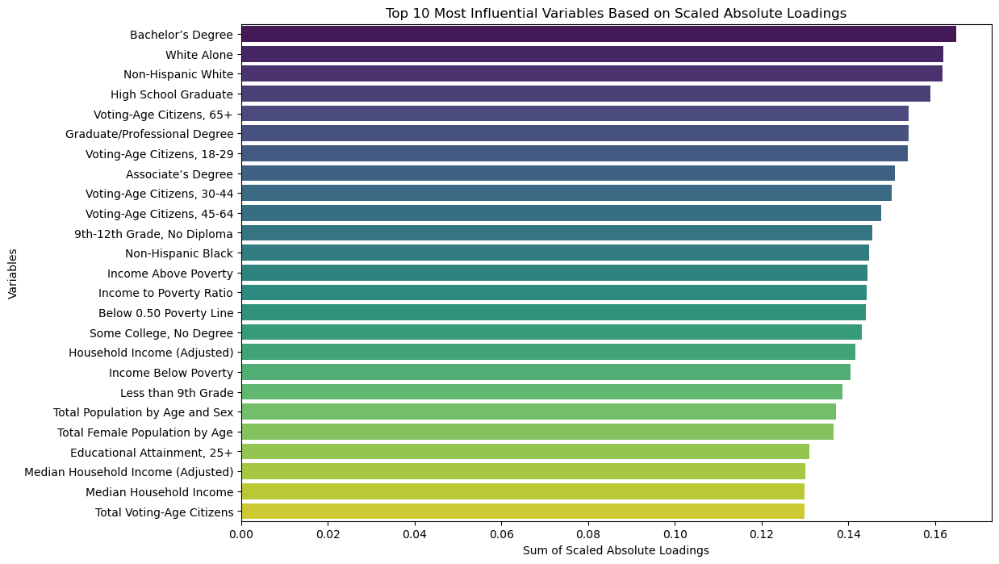

In [18]:
# Calculate the absolute values of the loadings for the first few principal components
abs_loadings = loadings_df.iloc[:, 1:16].abs()

# Scale the sum by explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_[:15]
print(explained_variance_ratio)

scaled_abs_loadings = abs_loadings * explained_variance_ratio

# Sum the absolute loadings for each variable
sum_abs_loadings = scaled_abs_loadings.sum(axis=1)

# Select the top 10 variables with the highest sum of absolute loadings
top_10_variables = sum_abs_loadings.nlargest(25).index

# Get the names of the top 10 variables
top_10_variable_names = loadings_df.loc[top_10_variables, 'Variable'].tolist()

print("Top 10 most influential variables based on loadings and scree plot:")
print(top_10_variable_names)
# Plot the scaled absolute loadings for the top 10 variables
plt.figure(figsize=(12, 8))
sns.barplot(x=sum_abs_loadings[top_10_variables], y=top_10_variable_names, palette="viridis")
plt.title("Top 10 Most Influential Variables Based on Scaled Absolute Loadings")
plt.xlabel("Sum of Scaled Absolute Loadings")
plt.ylabel("Variables")
plt.show()

Based on the PCA Analysis we can see which variable capture the most variation amongst the blocks in New York District.
However, this cannot necessarity be used to explain voter behaviour variables describing most variation may not have similar influence on actual party will in the precinct 
or voter turnout. However, we can glean from this that blocks in NY vary most along Education , Ethinicity and voting age population age groups and Income Level.

Highly correlated pairs:
('Total Population by Age and Sex', 'Total Female Population by Age')
('Total Population by Age and Sex', 'Total Voting-Age Citizens')
('Total Population by Age and Sex', 'Income Above Poverty')
('Total Population by Age and Sex', 'Household Income (Adjusted)')
('Total Population by Age and Sex', 'Income to Poverty Ratio')
('Total Population by Age and Sex', 'Educational Attainment, 25+')
('Total Female Population by Age', 'Total Voting-Age Citizens')
('Total Female Population by Age', 'Household Income (Adjusted)')
('Total Female Population by Age', 'Income to Poverty Ratio')
('Total Female Population by Age', 'Educational Attainment, 25+')
('Total Voting-Age Citizens', 'Income Above Poverty')
('Total Voting-Age Citizens', 'Household Income (Adjusted)')
('Total Voting-Age Citizens', 'Income to Poverty Ratio')
('Total Voting-Age Citizens', 'Educational Attainment, 25+')
('Voting-Age Citizens, 45-64', 'Income Above Poverty')
('Income Above Poverty', 'Household I

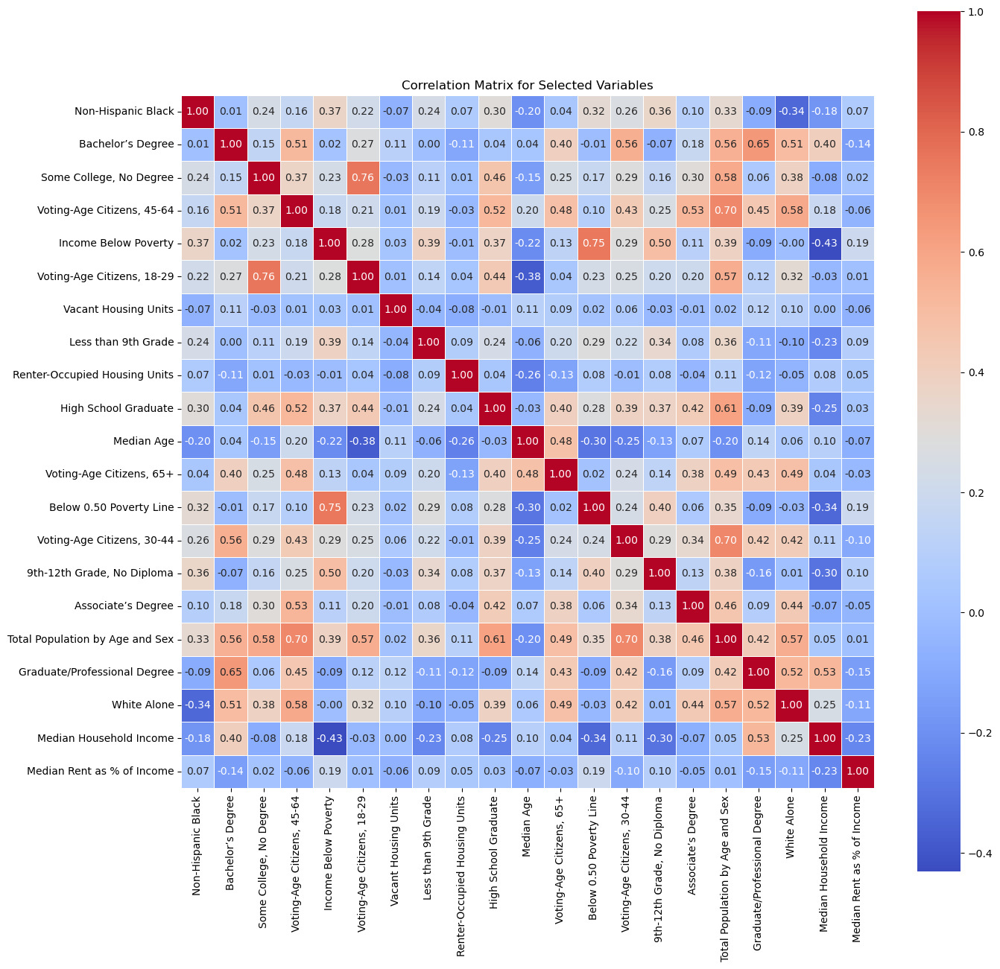

In [19]:
import numpy as np

# Calculate the correlation matrix for the specified variables
correlation_matrix = ny_blocks[variables_to_plot].corr().abs()

# Set a threshold for high correlation
threshold = 0.8

# Create a boolean mask to identify highly correlated pairs
high_corr_var = np.where(correlation_matrix > threshold)
high_corr_pairs = [(correlation_matrix.index[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

# Print highly correlated pairs
print("Highly correlated pairs:")
for pair in high_corr_pairs:
    print(pair)

# Select independent variables by keeping one variable from each pair of highly correlated variables
selected_variables = set(correlation_matrix.columns)
for var1, var2 in high_corr_pairs:
    if var2 in selected_variables:
        selected_variables.remove(var2)

# Convert the set to a list
selected_variables = list(selected_variables)

print("\nSelected independent variables:")
print(selected_variables)
# Plot the correlation matrix for the selected variables
plot_correlation_matrix(ny_blocks, selected_variables, title='Correlation Matrix for Selected Variables')

### Process for Mappting using GEOID

In [20]:
# Extract Block Group from the Name column and create a new column
ny_blocks['Block Group'] = ny_blocks['Name'].str.extract(r'Block Group (\d+)')
# Display the updated dataframe
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,Block Group
0,Block Group 1; Census Tract 1; Albany County; ...,724,435,634,182,97,146,209,53,93,...,334,205,724,41,45.2,494,75,1.95,20.9,1
1,Block Group 2; Census Tract 1; Albany County; ...,1535,815,935,267,254,257,157,106,88,...,391,777,1527,197,22.4,693,68,3.53,41.9,2
2,Block Group 1; Census Tract 2.01; Albany Count...,245,204,169,23,55,32,59,0,32,...,37,174,245,12,38.8,169,141,1.80,40.3,1
3,Block Group 2; Census Tract 2.01; Albany Count...,1437,618,1181,183,238,609,151,32,264,...,124,1090,1437,252,47.1,1076,293,1.85,51.0,2
4,Block Group 3; Census Tract 2.01; Albany Count...,783,324,598,41,346,113,98,0,46,...,211,478,783,94,37.1,642,110,1.75,28.2,3


In [21]:
ny_blocks['GEOID'] = ny_blocks['state'] + ny_blocks['county'] + ny_blocks['tract'] + ny_blocks['Block Group']
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,Block Group,GEOID
0,Block Group 1; Census Tract 1; Albany County; ...,724,435,634,182,97,146,209,53,93,...,205,724,41,45.2,494,75,1.95,20.9,1,360010001001
1,Block Group 2; Census Tract 1; Albany County; ...,1535,815,935,267,254,257,157,106,88,...,777,1527,197,22.4,693,68,3.53,41.9,2,360010001002
2,Block Group 1; Census Tract 2.01; Albany Count...,245,204,169,23,55,32,59,0,32,...,174,245,12,38.8,169,141,1.80,40.3,1,360010002011
3,Block Group 2; Census Tract 2.01; Albany Count...,1437,618,1181,183,238,609,151,32,264,...,1090,1437,252,47.1,1076,293,1.85,51.0,2,360010002012
4,Block Group 3; Census Tract 2.01; Albany Count...,783,324,598,41,346,113,98,0,46,...,478,783,94,37.1,642,110,1.75,28.2,3,360010002013


## Mapping Block County Data GIS

In [90]:
import geopandas as gpd
import pandas as pd

# Load the block group shapefile
shapefile_path = 'tl_2023_36_bg/tl_2023_36_bg.shp'  # Update with your local path
block_gdf = gpd.read_file(shapefile_path)

block_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16070 entries, 0 to 16069
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   16070 non-null  object  
 1   COUNTYFP  16070 non-null  object  
 2   TRACTCE   16070 non-null  object  
 3   BLKGRPCE  16070 non-null  object  
 4   GEOID     16070 non-null  object  
 5   GEOIDFQ   16070 non-null  object  
 6   NAMELSAD  16070 non-null  object  
 7   MTFCC     16070 non-null  object  
 8   FUNCSTAT  16070 non-null  object  
 9   ALAND     16070 non-null  int64   
 10  AWATER    16070 non-null  int64   
 11  INTPTLAT  16070 non-null  object  
 12  INTPTLON  16070 non-null  object  
 13  geometry  16070 non-null  geometry
dtypes: geometry(1), int64(2), object(11)
memory usage: 1.7+ MB


In [23]:
block_gdf['GEOID'] = block_gdf['STATEFP'] + block_gdf['COUNTYFP'] + block_gdf['TRACTCE'] + block_gdf['BLKGRPCE']

In [24]:
merged_gdf_block = block_gdf.merge(ny_blocks, on='GEOID', how='inner')

In [25]:
merged_gdf_block.drop(columns=['state', 'county', 'tract', 'Block Group'], inplace=True)
merged_gdf_block.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16070 entries, 0 to 16069
Data columns (total 45 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   STATEFP                             16070 non-null  object  
 1   COUNTYFP                            16070 non-null  object  
 2   TRACTCE                             16070 non-null  object  
 3   BLKGRPCE                            16070 non-null  object  
 4   GEOID                               16070 non-null  object  
 5   GEOIDFQ                             16070 non-null  object  
 6   NAMELSAD                            16070 non-null  object  
 7   MTFCC                               16070 non-null  object  
 8   FUNCSTAT                            16070 non-null  object  
 9   ALAND                               16070 non-null  int64   
 10  AWATER                              16070 non-null  int64   
 11  INTPTLAT            

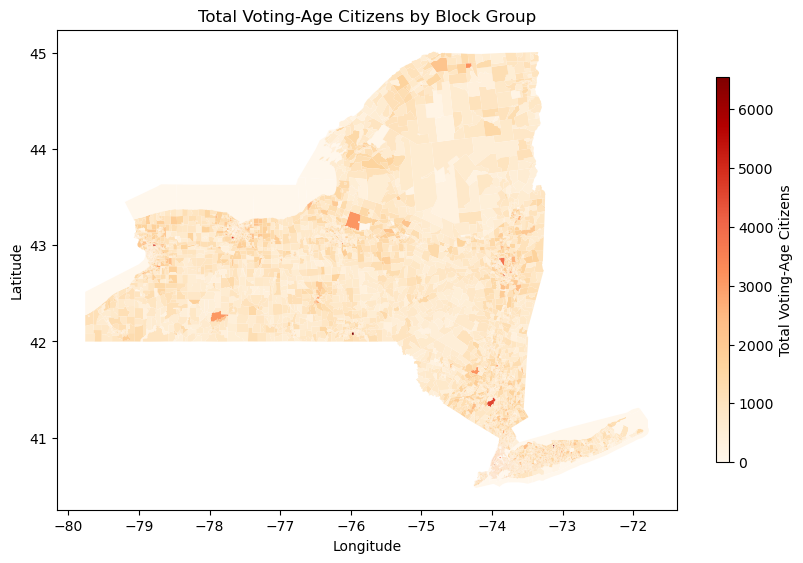

In [26]:
# Merge block_gdf with df_block using the GEOID column
variable_name = 'Total Voting-Age Citizens'
# Plot the merged GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Block Group')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_block[variable_name].astype(int).min(), vmax=merged_gdf_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

## Loading and Processing Precint Election Data

In [27]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "ny_2022_gen_prec/ny_2022_gen_prec/ny_2022_gen_prec.shp"  
gdf_precint = gpd.read_file(shapefile_path)

In [28]:
cong_15_UIDs = gdf_precint[gdf_precint["CONG_DIST"] == "15"]["UNIQUE_ID"]

In [29]:
gdf_precint['geometry'].is_valid.all()
sum(~gdf_precint['geometry'].is_valid)

4

In [30]:
# Filter columns that start with 'GCON', 'UNIQUE_ID', and 'geometry'
columns_to_keep = [col for col in gdf_precint.columns if col.startswith('GCON') or col in ['UNIQUE_ID', 'geometry']]

# Create a new GeoDataFrame with only the selected columns
filtered_gdf = gdf_precint[columns_to_keep]

In [31]:
# Define the columns to keep
columns_to_keep = ['GEOID', 'geometry'] + variables_to_plot

# Drop all other columns
merged_gdf_block = merged_gdf_block[columns_to_keep]

In [32]:
# Merge gdf_precint with merged_gdf_block using the GEOID column
merged_gdf_precint_block = gpd.sjoin(filtered_gdf, merged_gdf_block, how='inner', predicate='intersects')
columns_to_convert =  [
    'Total Population by Age and Sex', 'Total Female Population by Age', 'Total Voting-Age Citizens',
    'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64',
    'Voting-Age Citizens, 65+', 'Less than 9th Grade',
    '9th-12th Grade, No Diploma', 'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
    'Bachelor’s Degree', 'Graduate/Professional Degree',
    'Income Below Poverty', 'Income Above Poverty', 'Median Household Income', 'Household Income (Adjusted)',
    'Median Household Income (Adjusted)', 'White Alone', 'Non-Hispanic White',
    'Non-Hispanic Black', 'Income to Poverty Ratio', 'Below 0.50 Poverty Line', 'Median Age',
    'Educational Attainment, 25+', 'Vacant Housing Units',	'Renter-Occupied Housing Units',	'Median Rent as % of Income'
]
merged_gdf_precint_block[columns_to_convert] = merged_gdf_precint_block[columns_to_convert].apply(pd.to_numeric, errors='coerce')

In [33]:
# Define the columns to average
columns_to_average = ['Median Age', 'Median Rent as % of Income', 'Median Household Income', 'Household Income (Adjusted)', 'Median Household Income (Adjusted)']

# Define the columns to sum
columns_to_sum = [col for col in merged_gdf_precint_block.columns if col not in columns_to_average + ['UNIQUE_ID', 'geometry']]

# Group by 'UNIQUE_ID' and apply the appropriate aggregation functions
grouped_precint_block = merged_gdf_precint_block.groupby('UNIQUE_ID').agg(
    {**{col: 'mean' for col in columns_to_average}, **{col: 'sum' for col in columns_to_sum}}
).reset_index()

# Merge the geometry column back
grouped_precint_block['geometry'] = gdf_precint[gdf_precint['UNIQUE_ID'].isin(grouped_precint_block['UNIQUE_ID'])]['geometry']

# Convert to GeoDataFrame
grouped_precint_block = gpd.GeoDataFrame(grouped_precint_block, geometry='geometry')

In [34]:
sum(~gdf_precint['geometry'].is_valid)

4

In [35]:
# sum(~gdf_precint['geometry'].is_valid)
sum(~grouped_precint_block['geometry'].is_valid)

4

In [36]:
grouped_precint_block.shape

(13963, 113)

In [37]:
grouped_precint_block.reset_index(drop=True, inplace=True)

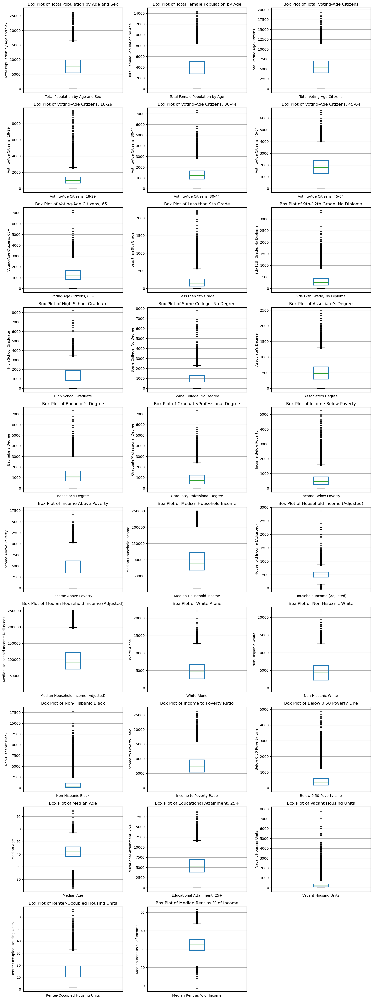

In [38]:
plot_box_plots(grouped_precint_block, variables_to_plot)

### Clean Data

In [39]:
# Replace NaN values with 1
# grouped_precint_block.fillna(1, inplace=True)
# Replace 0 values with 1
grouped_precint_block.replace(0, 1, inplace=True)

### Calculate Voter Turnout

In [40]:
# Create a new column 'tot' that sums all columns starting with 'GCON' indicating Congressional Election votes
grouped_precint_block['Total Votes'] = grouped_precint_block.filter(like='GCON').sum(axis=1)

# Display the updated DataFrame
# grouped_precint_block[["UNIQUE_ID", "Total Voting-Age Citizens", "Total Votes"]]
grouped_precint_block['Voter Turnout'] = grouped_precint_block['Total Votes'] / grouped_precint_block['Total Voting-Age Citizens']

### Check for Anomalies in Voter Turnout

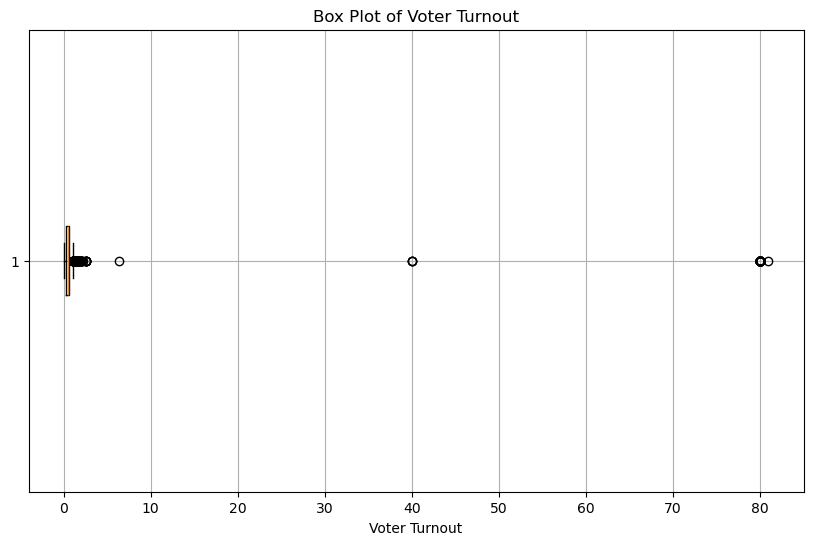

In [41]:
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Voter Turnout'].dropna(), vert=False)
plt.title('Box Plot of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.grid(True)
plt.show()

In [42]:
display(grouped_precint_block['Voter Turnout'].describe())
# Calculate the mode of the 'Voter Turnout' column
mode_voter_turnout = grouped_precint_block['Voter Turnout'].mean()

# Replace outliers greater than one with the mode
grouped_precint_block.loc[grouped_precint_block['Voter Turnout'] > 1, 'Voter Turnout'] = mode_voter_turnout

# Display the updated statistics
display(grouped_precint_block['Voter Turnout'].describe())
# grouped_precint_block = grouped_precint_block[grouped_precint_block['Voter Turnout'] <= 1]
# display(grouped_precint_block['Voter Turnout'].describe())

count    13963.000000
mean         1.021023
std          6.603209
min          0.004886
25%          0.289750
50%          0.439686
75%          0.614381
max         81.000000
Name: Voter Turnout, dtype: float64

count    13963.000000
mean         0.463001
std          0.242498
min          0.004886
25%          0.289750
50%          0.439686
75%          0.614381
max          1.021023
Name: Voter Turnout, dtype: float64

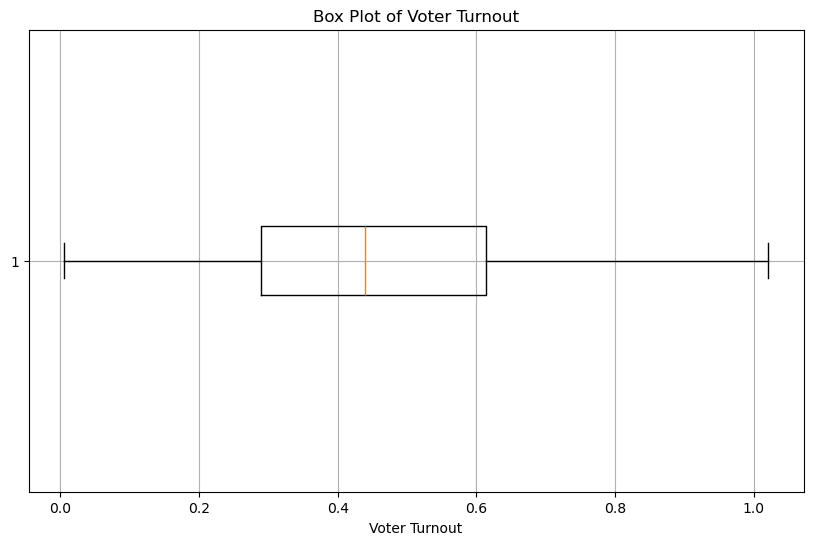

In [43]:
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Voter Turnout'].dropna(), vert=False)
plt.title('Box Plot of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.grid(True)
plt.show()

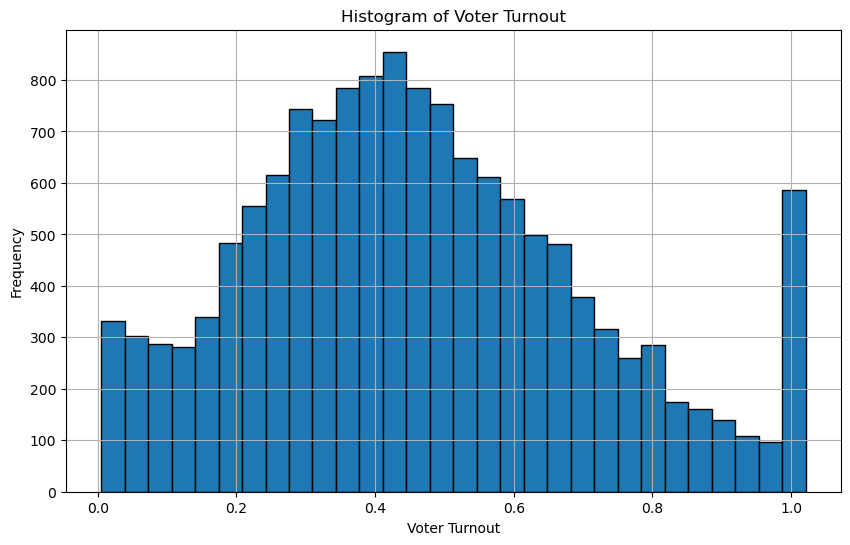

In [44]:
plt.figure(figsize=(10, 6))
plt.hist(grouped_precint_block['Voter Turnout'], bins=30, edgecolor='black')
plt.title('Histogram of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

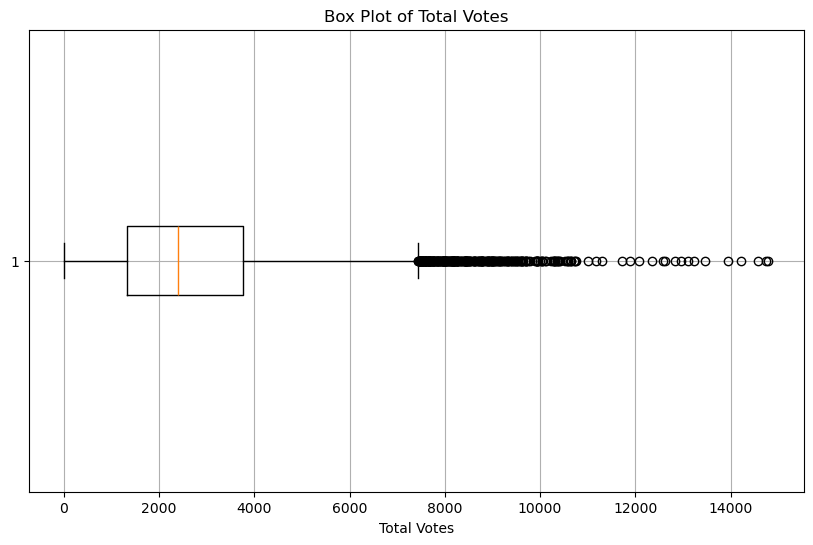

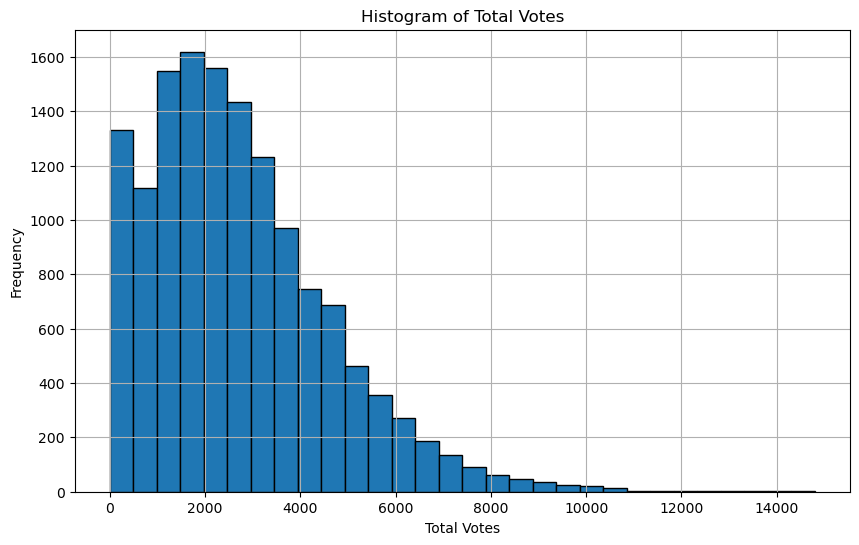

In [45]:
grouped_precint_block["Total Votes"] = grouped_precint_block["Total Voting-Age Citizens"] * grouped_precint_block["Voter Turnout"]
# Plot the box plot for Total Votes
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Total Votes'].dropna(), vert=False)
plt.title('Box Plot of Total Votes')
plt.xlabel('Total Votes')
plt.grid(True)
plt.show()

# Plot the histogram for Total Votes
plt.figure(figsize=(10, 6))
plt.hist(grouped_precint_block['Total Votes'], bins=30, edgecolor='black')
plt.title('Histogram of Total Votes')
plt.xlabel('Total Votes')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## GIS Plots

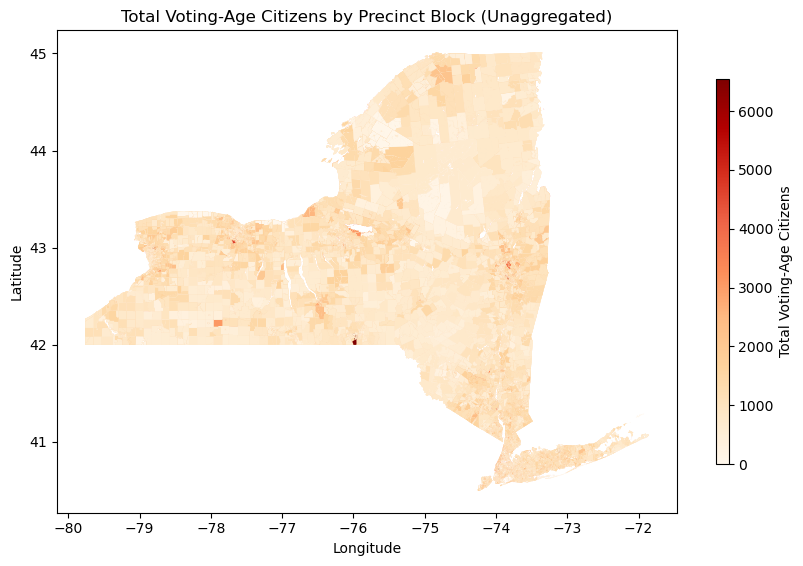

In [46]:
# Plot the merged GeoDataFrame for precinct blocks
variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_precint_block.plot(column= variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block (Unaggregated)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_precint_block[variable_name].astype(int).min(), vmax=merged_gdf_precint_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

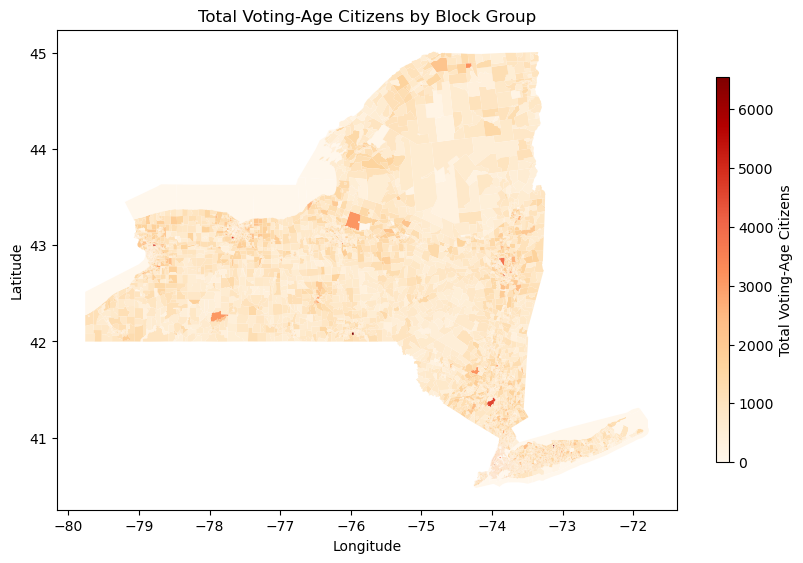

In [47]:
# Merge block_gdf with df_block using the GEOID column
variable_name = 'Total Voting-Age Citizens'
# Plot the merged GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Block Group')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_block[variable_name].astype(int).min(), vmax=merged_gdf_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

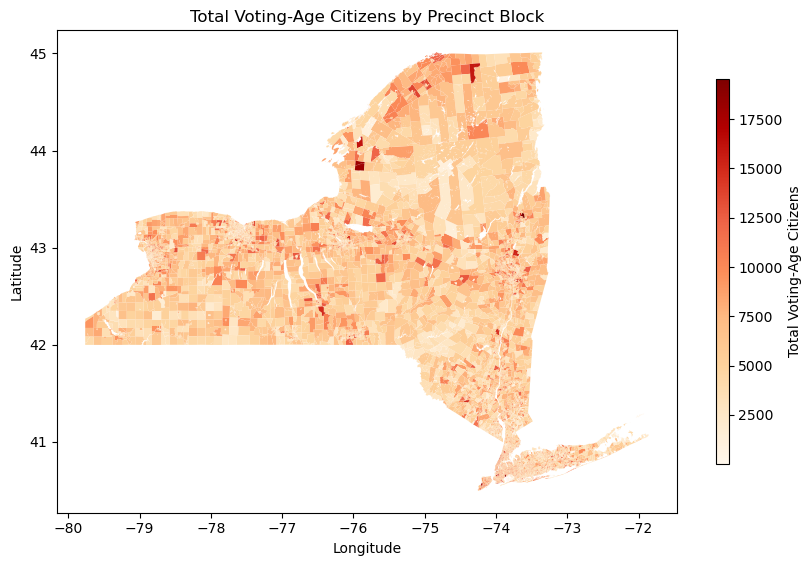

In [48]:
import matplotlib.pyplot as plt

variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

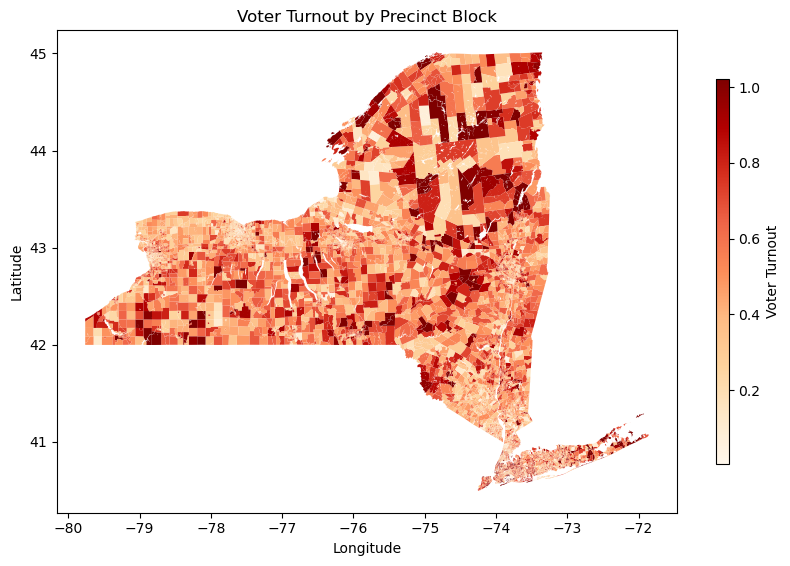

In [49]:
variable_name = 'Voter Turnout'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

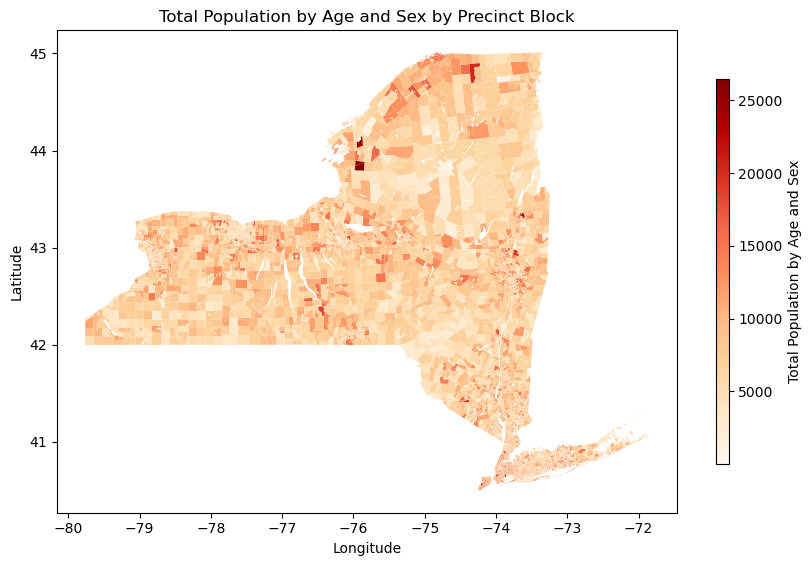

In [50]:
variable_name = 'Total Population by Age and Sex'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

The total populaiton distribution not being uniform indicates a fault in the method we merged or processed the GIS dataframes.

In [51]:
grouped_precint_block['Total Population by Age and Sex'].describe()

count    13963.000000
mean      7903.120533
std       3412.887047
min          1.000000
25%       5515.000000
50%       7577.000000
75%       9900.000000
max      26464.000000
Name: Total Population by Age and Sex, dtype: float64

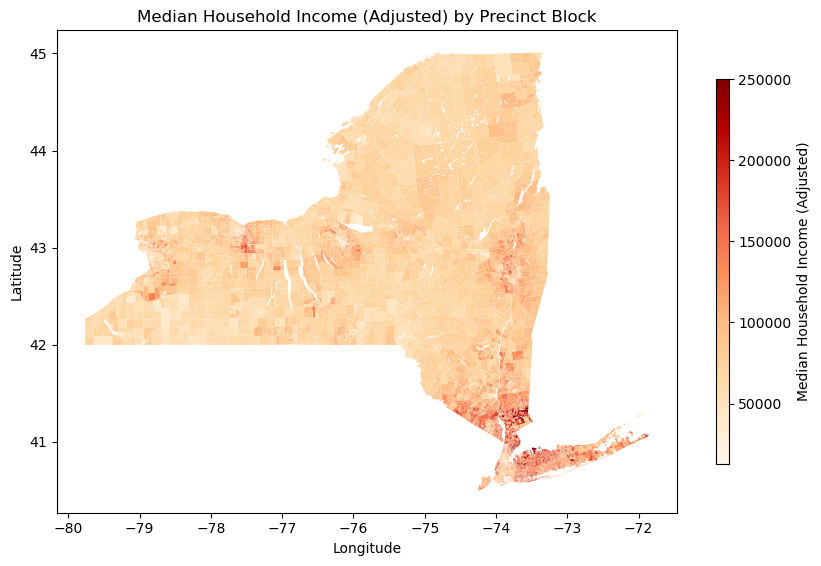

In [52]:
variable_name = 'Median Household Income (Adjusted)'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

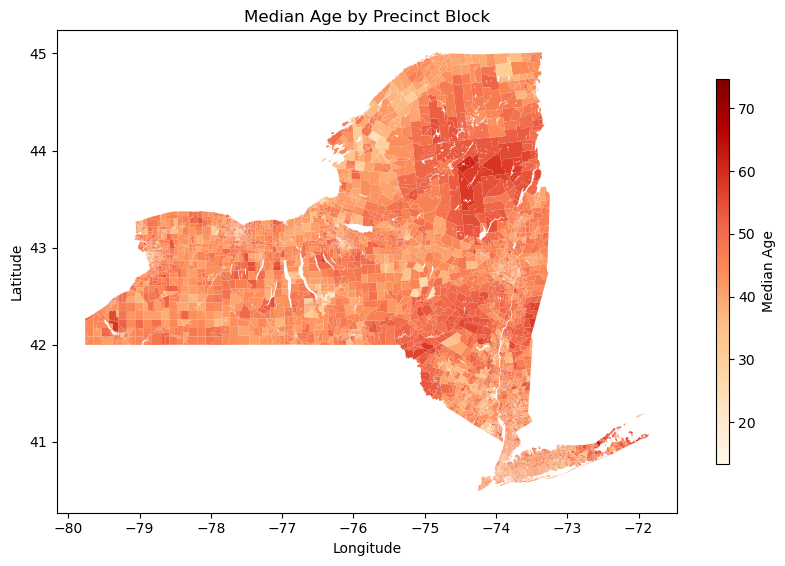

In [53]:
variable_name = 'Median Age'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

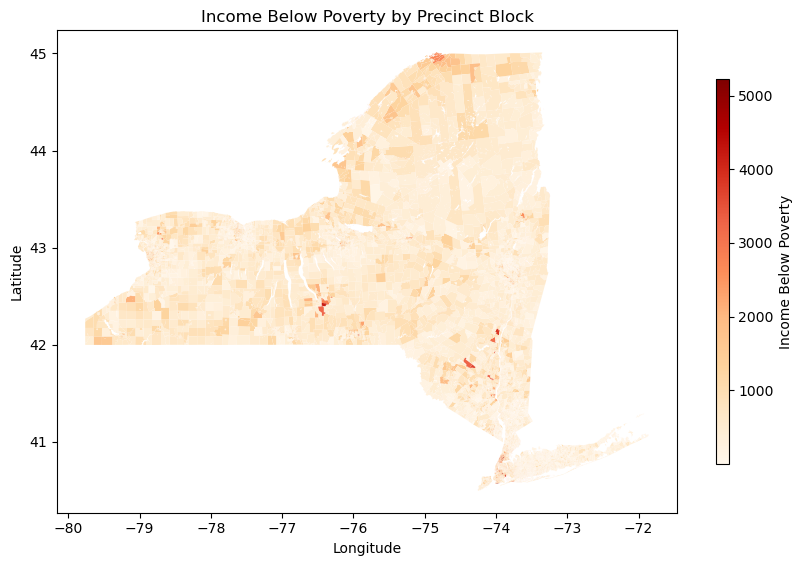

In [54]:
variable_name = 'Income Below Poverty'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

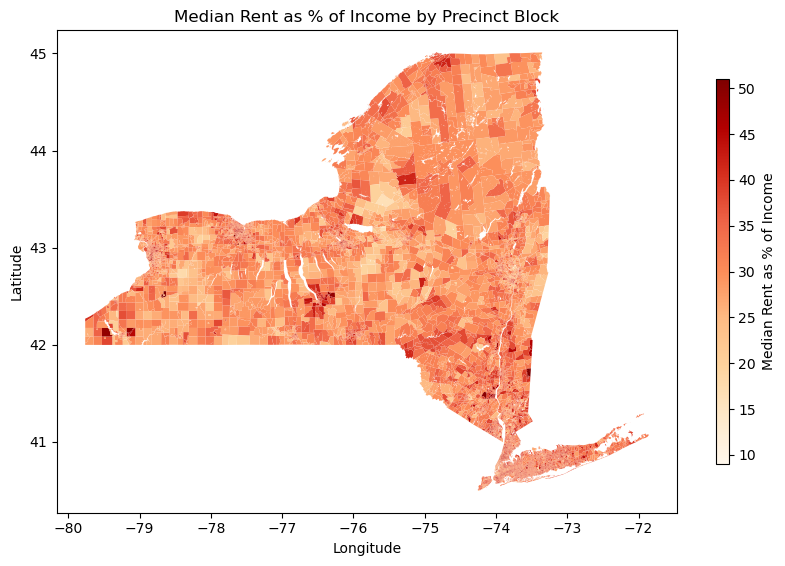

In [55]:
variable_name = 'Median Rent as % of Income'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

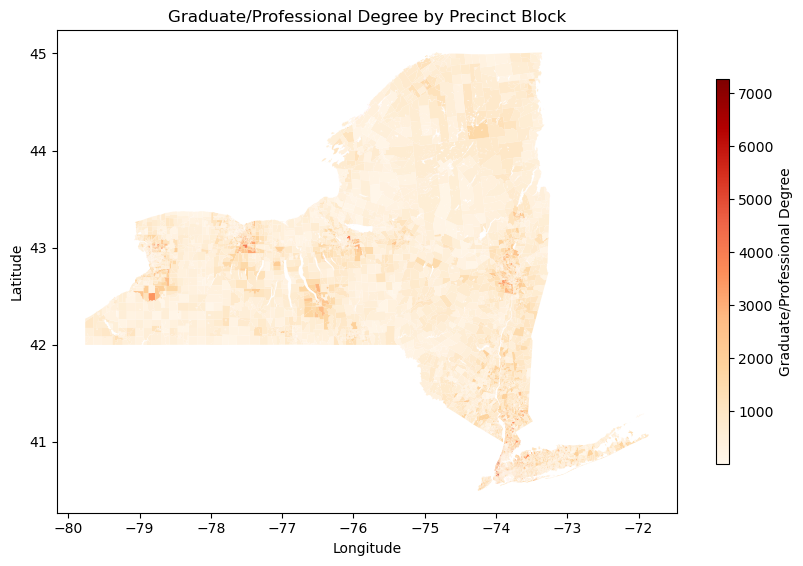

In [56]:
variable_name = 'Graduate/Professional Degree'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

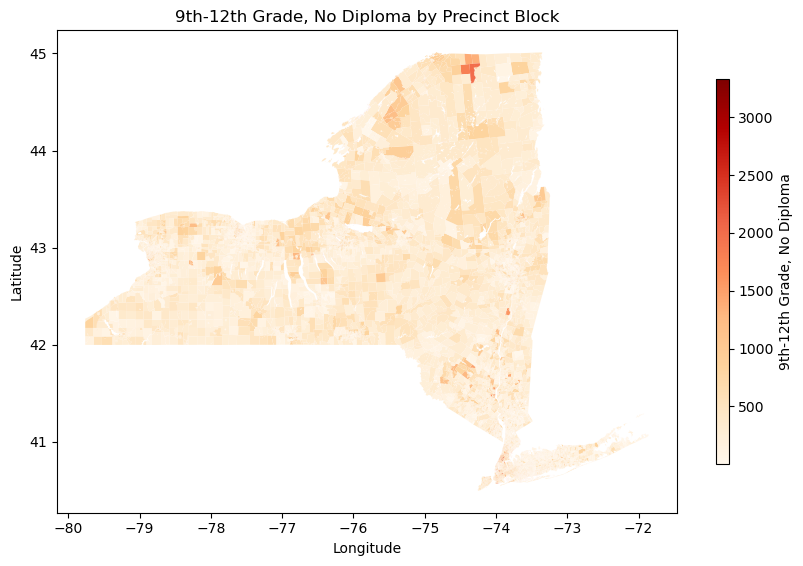

In [57]:
variable_name = '9th-12th Grade, No Diploma'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

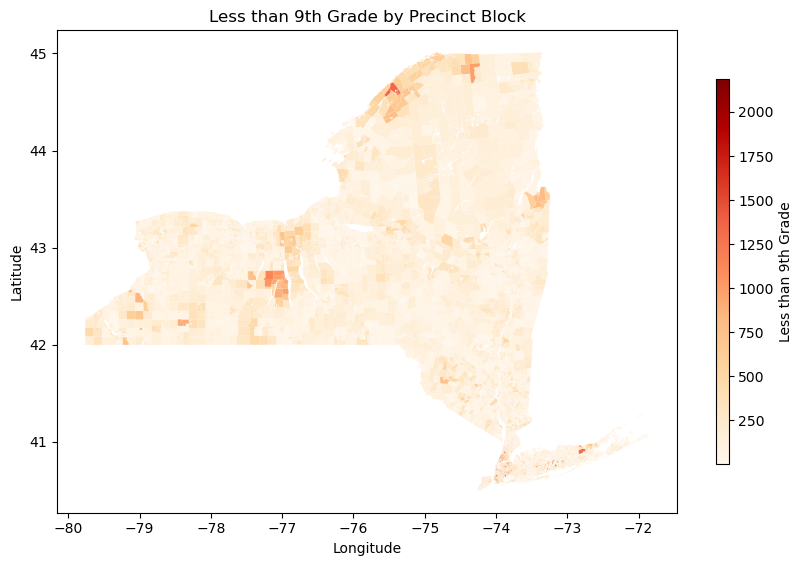

In [58]:
variable_name = 'Less than 9th Grade'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

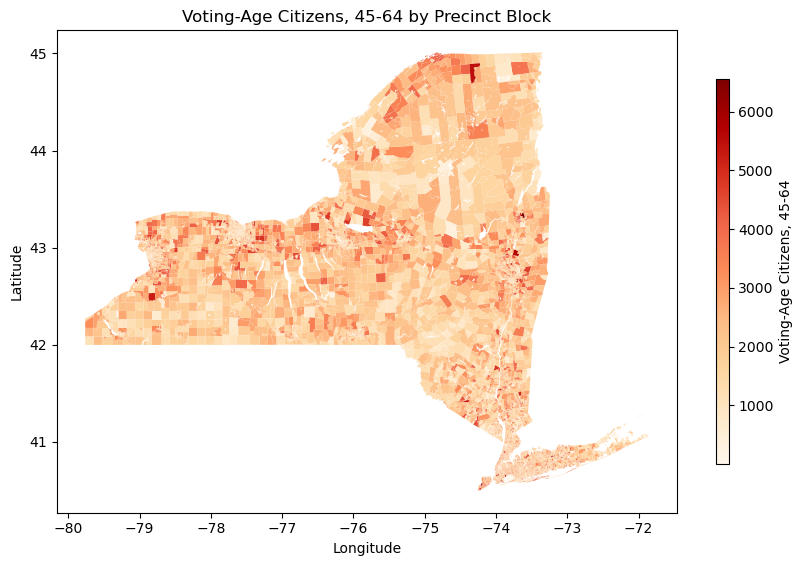

In [59]:
variable_name = 'Voting-Age Citizens, 45-64'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

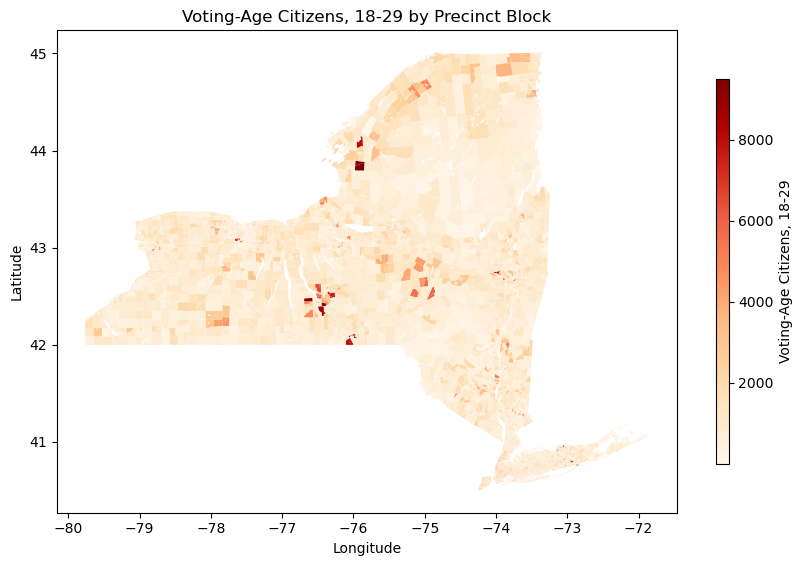

In [60]:
variable_name = 'Voting-Age Citizens, 18-29'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

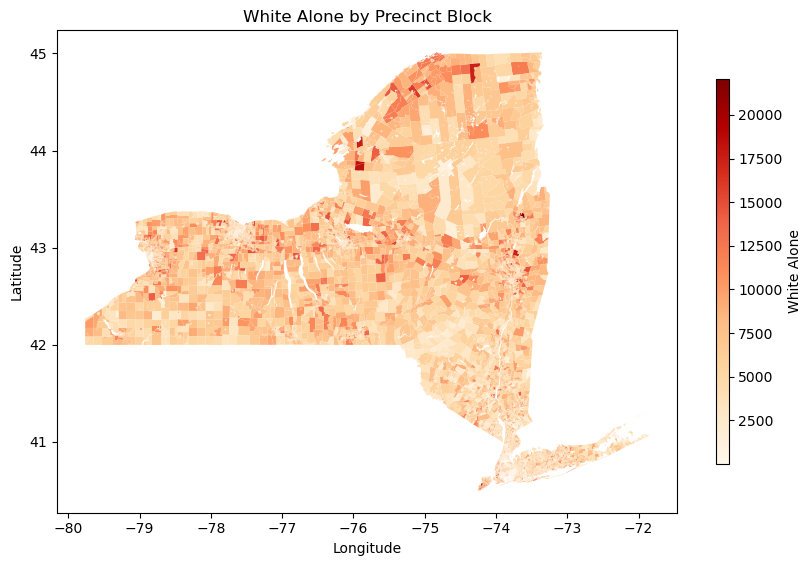

In [61]:
variable_name = 'White Alone'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

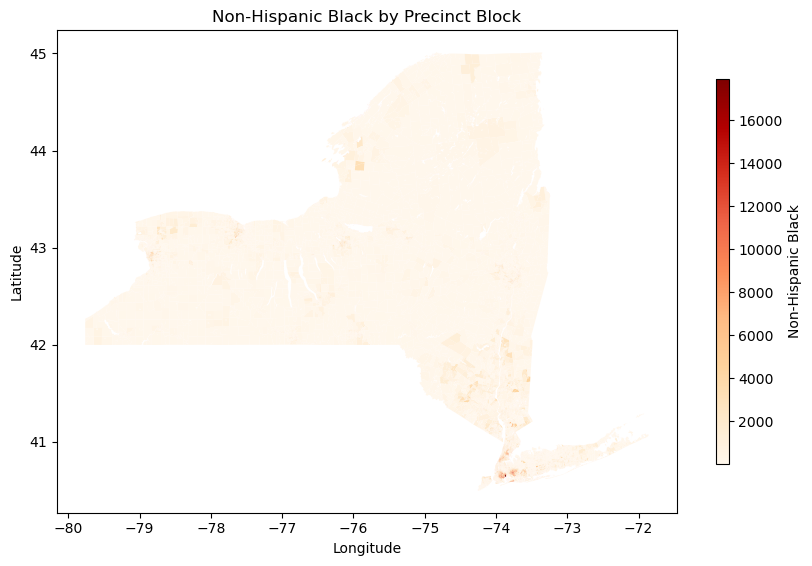

In [62]:
variable_name = 'Non-Hispanic Black'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

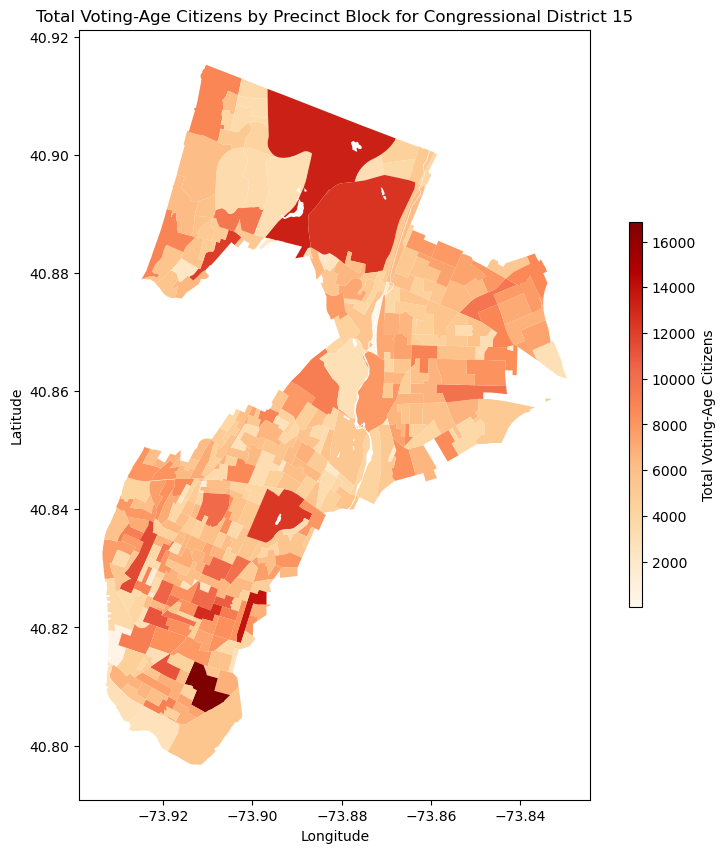

In [63]:
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_gdf = grouped_precint_block[grouped_precint_block['UNIQUE_ID'].isin(cong_15_UIDs)]

# Plot the filtered GeoDataFrame
variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

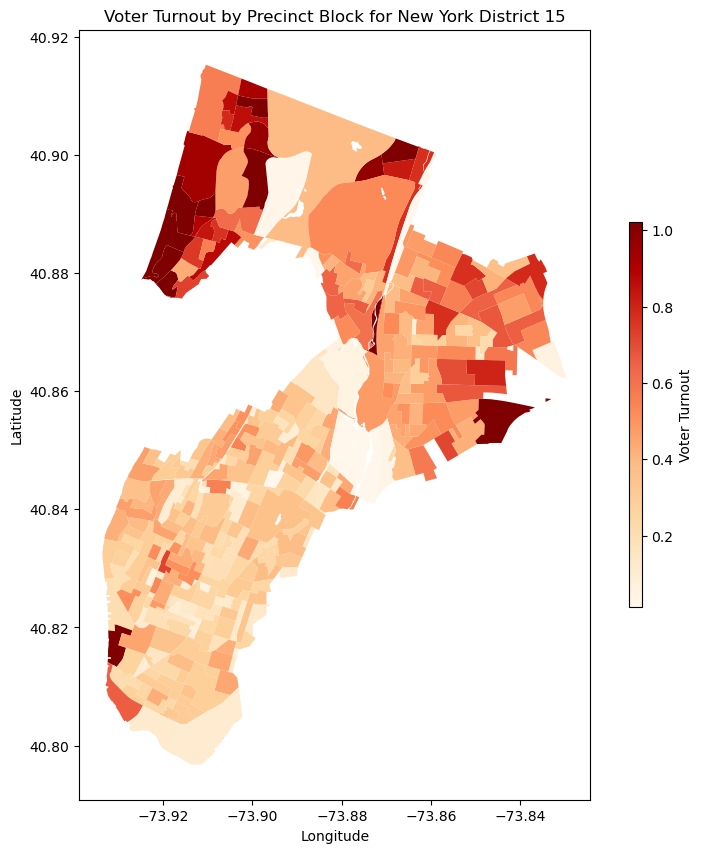

In [87]:
# Plot the filtered GeoDataFrame
variable_name = 'Voter Turnout'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for New York District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

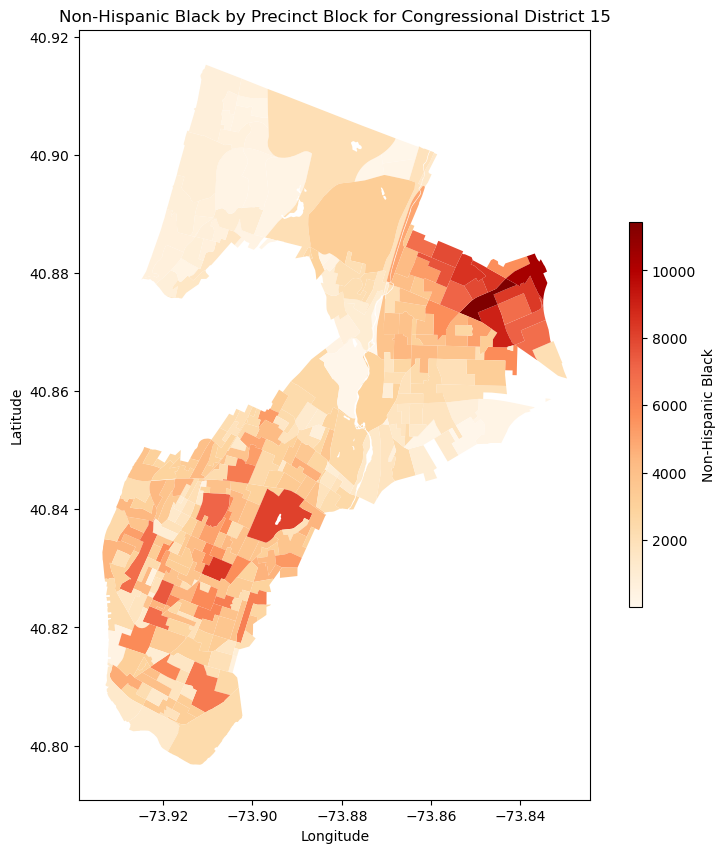

In [65]:
# Plot the filtered GeoDataFrame
variable_name = 'Non-Hispanic Black'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

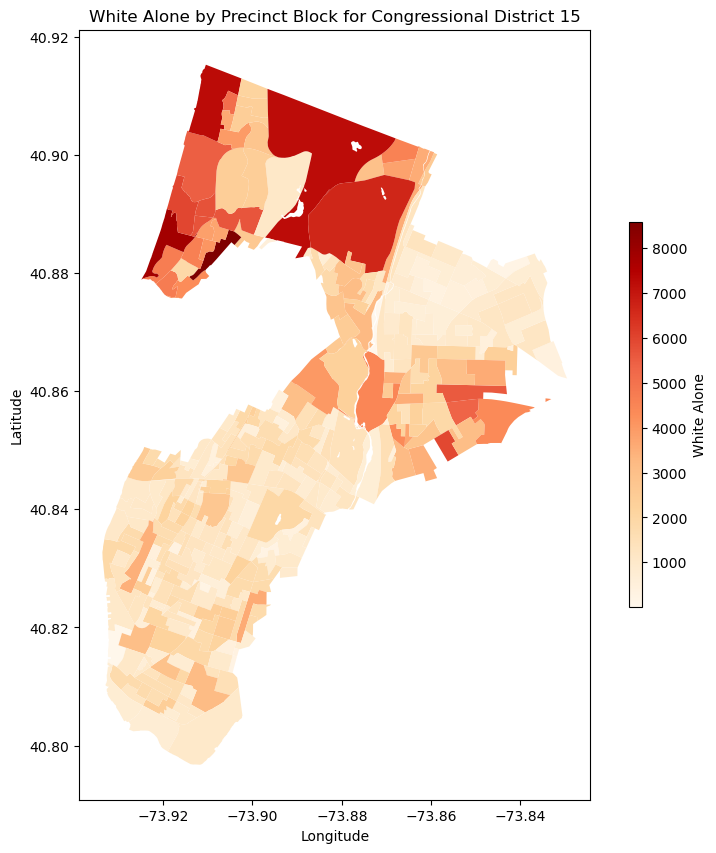

In [66]:
# Plot the filtered GeoDataFrame
variable_name = 'White Alone'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

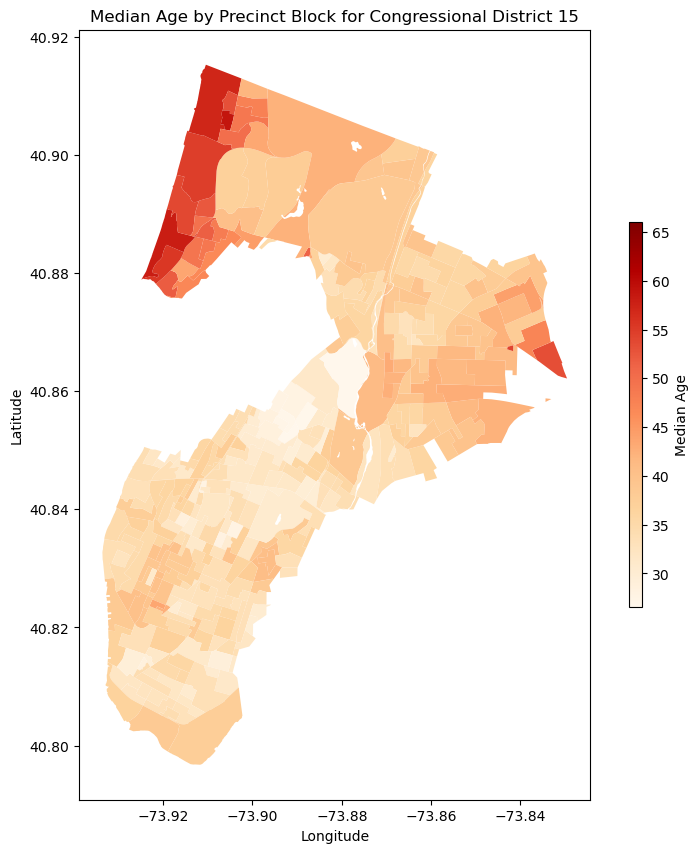

In [82]:
# Plot the filtered GeoDataFrame
variable_name = 'Median Age'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

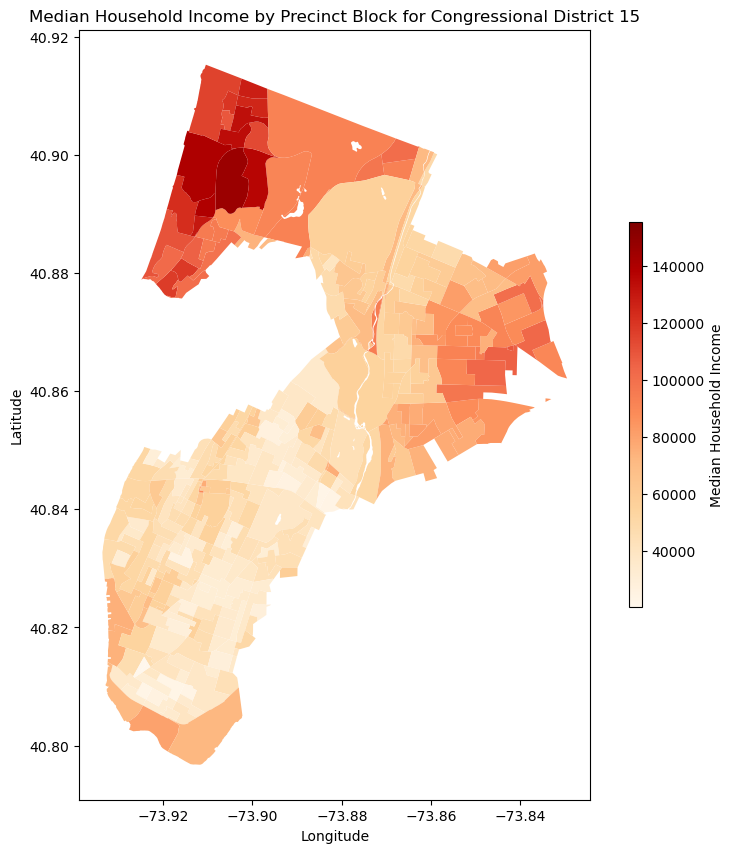

In [84]:
# Plot the filtered GeoDataFrame
variable_name = 'Median Household Income'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

## Eleection Data 

In [67]:
ny_parties = gpd.read_file("ny_2022_gen_prec/ny_2022_gen_prec_PARTIES/ny_2022_gen_prec_PARTIES.shp")

In [ ]:
import re

# Define a function to map the party code to the party name
def map_party(party_code):
    party_map = {
        'A': 'Arts & Culture',
        'B': 'Broadband Now Party',
        'C': 'Conservative',
        'D': 'Democratic',
        'E': 'We the People Party',
        'F': 'Medical Freedom Party',
        'H': 'Rent is 2 Damn High Party',
        'I': 'Independence',
        'L': 'LaRouche Party',
        'M': 'Moderate Party',
        'O': 'Other / Write In',
        'P': 'Parent Party',
        'R': 'Republican',
        'T': 'Integrity Party',
        'W': 'Working Families Party',
        'X': 'Independent'
    }
    return party_map.get(party_code, 'Unknown')

# Extract candidate columns and map to parties
candidate_columns = [col for col in ny_parties.columns if col.startswith('GCON')]
candidate_party_map = {col: map_party(col[6]) for col in candidate_columns}

# Display the mapping
for candidate, party in candidate_party_map.items():
    print(f"{candidate}: {party}")

party_colormap = {}
for party in set(candidate_party_map.values()):
    if party in ['Democratic', 'Republican']:
        party_colormap[party] = 'blue' if party == 'Democratic' else 'red'
    else:
        party_colormap[party] = 'yellow'
party_colormap

Winner_Party
Democratic                8168
Republican                5245
Conservative               546
Working Families Party       4
Name: count, dtype: int64


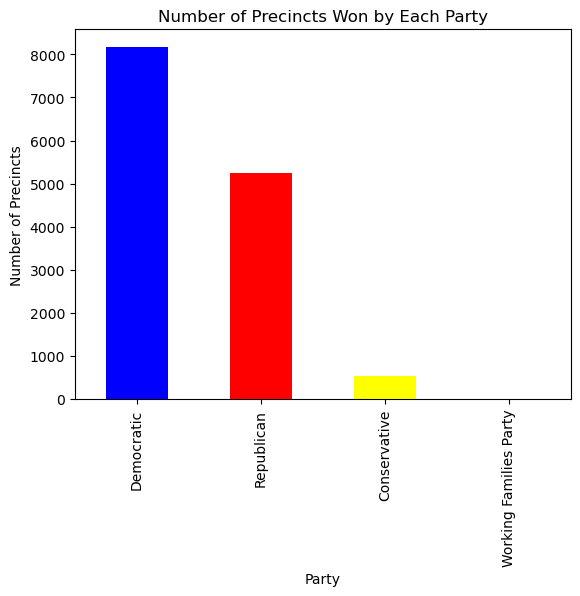

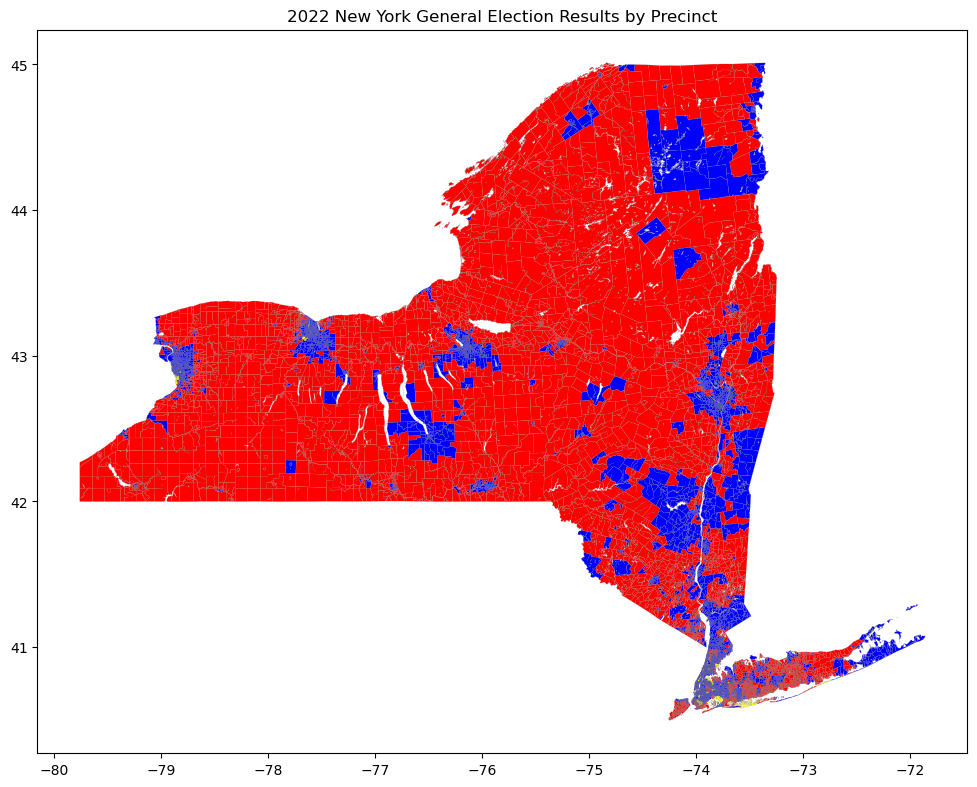

In [69]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Identify the winning candidate based on the maximum votes among the selected columns
ny_parties['Winner_Candidate'] = ny_parties[candidate_columns].idxmax(axis=1)

# Map the winning candidate to their respective party
ny_parties['Winner_Party'] = ny_parties['Winner_Candidate'].map(candidate_party_map)
print(ny_parties['Winner_Party'].value_counts())
# ny_parties['Winner_Party'].value_counts()
ny_parties['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.title('Number of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
plt.show()
# Filter to retain only Democratic and Republican winners
# ny_parties = ny_parties[ny_parties['Winner_Party'].isin(['Democratic', 'Republican'])]

# Map colors to the Winner_Party column using party_colormap
ny_parties['color'] = ny_parties['Winner_Party'].map(party_colormap)

# Check for NaN values in the 'color' column and fill with a default color if any
ny_parties['color'].fillna('grey', inplace=True)
# # Merge precinct data with party results
election_merged = grouped_precint_block.merge(ny_parties[['UNIQUE_ID', 'Winner_Party', 'color']], on='UNIQUE_ID', how='inner')

# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
election_merged.plot(column='color', color=ny_parties['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Results by Precinct")


plt.show()

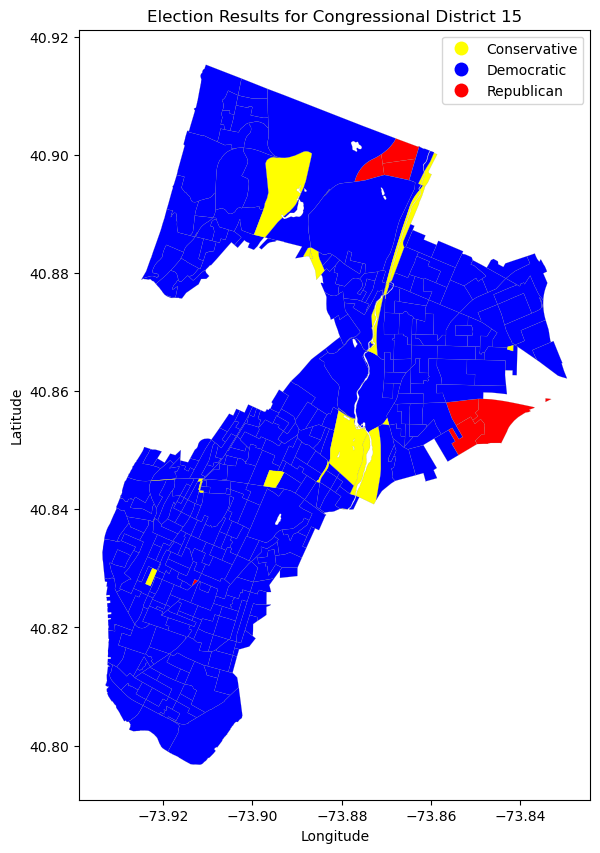

In [70]:
from matplotlib.colors import ListedColormap
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_election_data = election_merged[election_merged['UNIQUE_ID'].isin(cong_15_UIDs)]
ny_parties_filtered = ny_parties[ny_parties['UNIQUE_ID'].isin(cong_15_UIDs)]

custom_colors = ['#FFFF00', '#0000FF', '#FF0000']
custom_cmap = ListedColormap(custom_colors)
# Plot the filtered GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
filtered_election_data.plot(column='Winner_Party', ax=ax, legend=True, cmap=custom_cmap , linewidth=0.1, edgecolor='0.5')
# filtered_election_data.plot(column='color', color=filtered_election_data['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title('Election Results for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

In [81]:
filtered_election_data['Winner_Party'].value_counts()

Winner_Party
Democratic      319
Conservative     33
Republican        7
Name: count, dtype: int64

<Axes: xlabel='Winner_Party'>

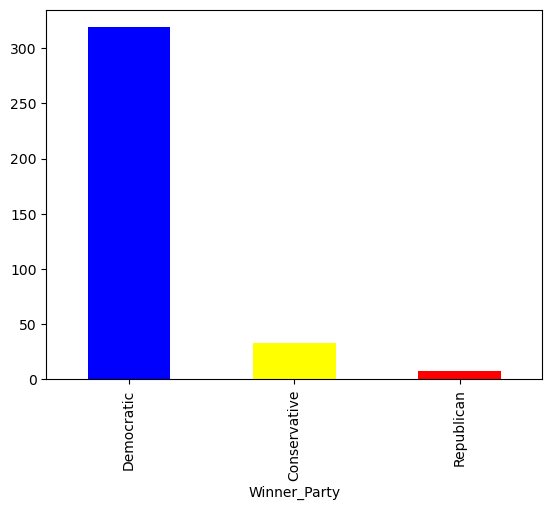

In [72]:
filtered_election_data['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'yellow', 'red'])

In [73]:
columns_to_drop = [col for col in election_merged.columns if col.startswith('GCON') or col in ['color', 'UNIQUE_ID', 'geometry']]
prediction_data = election_merged.drop(columns=columns_to_drop, inplace=False)
prediction_data.columns

Index(['Median Age', 'Median Rent as % of Income', 'Median Household Income',
       'Household Income (Adjusted)', 'Median Household Income (Adjusted)',
       'index_right', 'GEOID', 'Total Population by Age and Sex',
       'Total Female Population by Age', 'Total Voting-Age Citizens',
       'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44',
       'Voting-Age Citizens, 45-64', 'Voting-Age Citizens, 65+',
       'Less than 9th Grade', '9th-12th Grade, No Diploma',
       'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
       'Bachelor’s Degree', 'Graduate/Professional Degree',
       'Income Below Poverty', 'Income Above Poverty', 'White Alone',
       'Non-Hispanic White', 'Non-Hispanic Black', 'Income to Poverty Ratio',
       'Below 0.50 Poverty Line', 'Educational Attainment, 25+',
       'Vacant Housing Units', 'Renter-Occupied Housing Units', 'Total Votes',
       'Voter Turnout', 'Winner_Party'],
      dtype='object')

In [74]:
prediction_data['Winner_Party'].head()

0    Democratic
1    Democratic
2    Democratic
3    Democratic
4    Democratic
Name: Winner_Party, dtype: object

In [75]:
prediction_data['Winner_Party'].unique()

array(['Democratic', 'Conservative', 'Republican',
       'Working Families Party'], dtype=object)

In [76]:
number_of_classes = len(prediction_data['Winner_Party'].unique())

prediction_data['Winner_Party'] = prediction_data['Winner_Party'].map({'Democratic': 1, 'Republican': 2, 'Conservative': 0, 'Working Families Party': 0})

In [77]:
prediction_data.drop(columns=['GEOID'], inplace=True)

In [78]:
prediction_data.head()

,Median Age,Median Rent as % of Income,Median Household Income,Household Income (Adjusted),Median Household Income (Adjusted),index_right,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29",...,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Total Votes,Voter Turnout,Winner_Party
0,43.140000,32.664415,93671.8,519.200000,93796.800000,49431,6046,3342,4502,864,...,4262,531,6025,290,4062,248,9.159985,348.0,0.077299,1
1,37.100000,27.333333,52655.0,388.666667,52319.000000,31343,2615,1223,1976,402,...,519,1291,2556,474,1786,455,6.470000,100.0,0.050607,1
2,39.266667,31.153680,91377.0,532.500000,91267.500000,63830,7572,4054,5451,1336,...,4102,1535,7543,254,4948,308,11.320000,1302.0,0.238855,1
3,37.433333,28.460173,82672.0,416.833333,88428.303551,60363,5696,3062,3643,639,...,2841,779,5675,256,3743,248,11.210000,1613.0,0.442767,1
4,32.580000,22.420000,65431.8,411.400000,72212.764262,45513,5252,2714,3401,912,...,1794,1175,5173,262,3275,410,10.220000,1232.0,0.362246,1


In [79]:
# Save predictions 

Accuracy: 0.8431793770139635


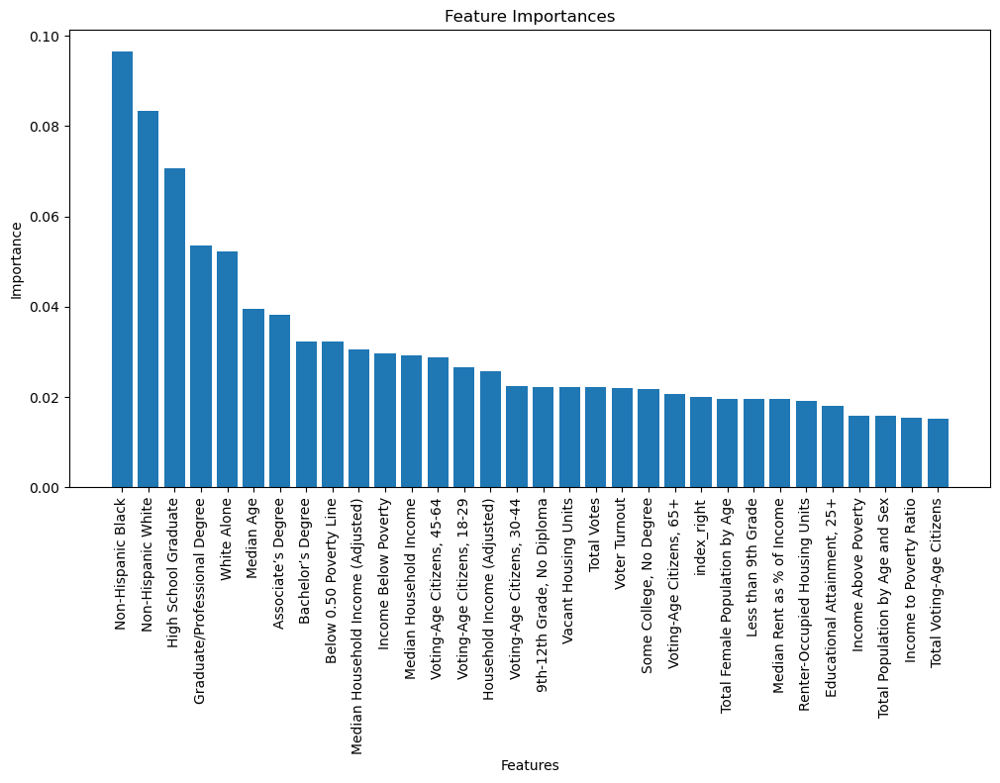

Accuracy (Top 10 Features): 0.8281417830290011
Accuracy (Top 5 Features): 0.7858933046902972


In [80]:
# normalize the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
prediction_data_scaled = scaler.fit_transform(prediction_data)

# Split the data into features and target
X = prediction_data_scaled[:, :-1]
y = prediction_data_scaled[:, -1]

# Convert the target variable to categorical values
y = (y > 0).astype(int)  # Example: Convert to binary classification

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Plot the feature importances
importances = rf_classifier.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), prediction_data.columns[:-1][indices], rotation=90)
plt.title('Feature Importances')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

# Train a Random Forest Classifier with the top 10 features
X_train_top = X_train[:, indices[:10]]
X_test_top = X_test[:, indices[:10]]

rf_classifier_top = RandomForestClassifier(random_state=42)
rf_classifier_top.fit(X_train_top, y_train)

# Make predictions
y_pred_top = rf_classifier_top.predict(X_test_top)

# Evaluate the model
accuracy_top = accuracy_score(y_test, y_pred_top)
print(f"Accuracy (Top 10 Features): {accuracy_top}")

# Train a Random Forest Classifier with the top 5 features
X_train_top = X_train[:, indices[:5]]
X_test_top = X_test[:, indices[:5]]

rf_classifier_top = RandomForestClassifier(random_state=42)
rf_classifier_top.fit(X_train_top, y_train)

# Make predictions
y_pred_top = rf_classifier_top.predict(X_test_top)

# Evaluate the model
accuracy_top = accuracy_score(y_test, y_pred_top)
print(f"Accuracy (Top 5 Features): {accuracy_top}")